In [1]:
import multiprocessing as mp
import matplotlib.pyplot as plt
import matplotlib.colors as mpl_colors
import matplotlib.cm as mpl_cm
from brian2.only import *

%load_ext autoreload
%autoreload 1

%aimport numpy_
%aimport spatial
%aimport model
%aimport inputs
%aimport util
%aimport spike_utils
%aimport readout

# for the IDE:
import numpy_ as np
import spatial, model, inputs, readout

from util import concatenate
np.concatenate = concatenate
from spike_utils import iterspikes

In [2]:
rng = np.random.default_rng()
set_device('cpp_standalone')
prefs.devices.cpp_standalone.openmp_threads = mp.cpu_count() - 2

# Parameters

In [3]:
N = 1000
inhibitory_ratio = .2

params = {
    # Simulation
    'dt': 1*ms,
    
    # Population size
    'N': N,
    'N_exc': int((1-inhibitory_ratio) * N),
    'N_inh': int(inhibitory_ratio * N),

    # Membrane
    'v_rest': -60*mV,
    'v_reset': -74*mV,
    'v_threshold': -54*mV,
    'voltage_init': 'v_rest',
    
    'tau_mem': 30*ms,
    'refractory_exc': 3*ms,
    'refractory_inh': 2*ms,

    # Threshold adaptation - Exc
    'th_tau': 1*second,
    'th_ampl': 1*mV,

    # Short-term plasticity - Exc
    'tau_rec': 150*msecond,
    'U': 0.4,

    # Synapse dynamics
    'E_exc': 0*mV,
    'tau_ampa': 2*msecond,
    'E_inh': -100*mV,
    'tau_gaba': 4*msecond,
    
    # # Stochasticity
    # 'tau_noise': 10*msecond,
    # 'vnoise_std': 0.5*mV,

    # Layout
    'r_dish': 4*mm,
    'weight_distribution': 'singular',
    
    # Connectivity: Inh
    'r_inh': 1*mm,
    'outdeg_inh': 50,
    'w_inh_mean': 1,

    # Connectivity: Exc
    'r_exc': 2*mm,
    'outdeg_exc': 50,
    'w_exc_mean': 1,

    # Stimulus
    'N_stimuli': 5,
    'stim_distribution_radius': 2.5*mm,
    'neurons_per_stim': 10,
    'input_strength': 100,

    # Paradigm
    'settling_period': 1*second,
    'sequence_length': 5,
    'sequence_count': 20,
    'fully_random_msc': True,
    'ISI': 500*ms,
}

# Function definitions

In [4]:
def plot_events(W, params, full_results, neuron_idx, figsize=None):
    sources = np.flatnonzero(W[:, neuron_idx] > 0)
    weights = W[sources, neuron_idx]
    keys = ('std', 'dev', 'msc')
    
    target_hists, source_hists, source_xrs = [], [], []
    for key in keys:
        target_hists.append(full_results[key]['spike_hist'][neuron_idx])
        source_hists.append(full_results[key]['spike_hist'][sources])
        source_xrs.append(readout.get_infused_histogram(params, full_results[key], lambda r,p,i,t: r['xr'][i,p,t]).sum(1)[sources])
    
    target_hists = np.asarray(target_hists)  # key, t
    source_hists = np.asarray(source_hists)  # key, sources, t
    source_xrs = np.asarray(source_xrs)  # key, sources
    tmax = max(
        np.flatnonzero(source_hists.sum(axis=(0,1)) > 0)[-1],
        np.flatnonzero(target_hists.sum(axis=0) > 0)[-1]
    )
    x = np.arange(tmax+1)*params['dt'] / msecond
    y = np.arange(len(sources)+1)

    weight_signs = np.ones(len(sources))
    weight_signs[sources >= params['N_exc']] = -1
    maxw = weights.max()
    weighted_total = np.sum(source_xrs * weights * weight_signs, axis=0)
    order = np.argsort(weighted_total)

    fig, axs = plt.subplots(len(keys), figsize=figsize)
    for i, (ax, key) in enumerate(zip(axs, keys)):
        m = ax.pcolormesh(x, y, source_hists[i, order, :tmax] * weight_signs[order, None], vmin=-1, vmax=1, cmap='seismic_r', shading='flat')
        ax.axhline(y[-1], color='k', lw=1)
        ax.pcolormesh(x, np.asarray([y[-1], y[-1]+5]), target_hists[i, None, :tmax], vmin=0, vmax=1, cmap='Greys', shading='flat')
        ax.set_ylabel(key)

        ax3 = ax.twiny()
        ax3.plot(weights[order] * full_results[key]['xr'][sources[order], :, 0].mean(1), np.arange(len(sources)), c='magenta', lw=1)
        ax3.plot(weights[order], np.arange(len(sources)), c='purple', lw=1)
        ax3.plot(full_results[key]['th_adapt'][sources[order], :, 0].mean(1)/mV, np.arange(len(sources)), c='green', lw=1)
        ax3.plot(full_results[key]['th_adapt'][neuron_idx, :, 0].mean()/mV, y[-1]+2.5, 'g*')
        ax3.set_xlim([5*maxw, 0])
        if i == 0:
            ax3.set_xticks([maxw, maxw/2, 0])
            ax3.set_xlabel('|w| (purple); STD at t=0 (magenta); adaptation at t=0 (green, mV)')
        else:
            ax3.set_xticks([])
    plt.colorbar(m, location='right', ax=axs, label='signed p(spike)')

In [5]:
def get_onset_ordering(full_results, limit=None, filter=None):
    hist_sum = np.sum([full_results[key]['spike_hist'] for key in ('std', 'dev', 'msc')], axis=0)
    first_index = np.sum(np.cumsum(hist_sum, axis=1) == 0, axis=1)
    safe_first_index = first_index.copy()
    safe_first_index[first_index >= hist_sum.shape[1]] = 0
    first_intensity = hist_sum[np.arange(hist_sum.shape[0]), safe_first_index]
    onset_sort = np.lexsort((-first_intensity, first_index))
    order = onset_sort[:limit]
    if filter is not None:
        order = order[np.isin(order, filter)]
    tmax = np.flatnonzero(hist_sum[order].sum(axis=0))[-1] + 1
    return order, tmax

In [6]:
def time(ticks):
    return ticks*params['dt'] / msecond

In [7]:
def plot_pulse_hist(full_results, histograms, limit=None, filter=None, figsize=(10,15), grid=False, cmap='PiYG', vmin=None, vmax=None, symmetric=True):
    selection, tmax = get_onset_ordering(full_results, limit, filter)
    limit = len(selection)
    histograms = np.asarray(histograms)
    x = time(np.arange(tmax+1))
    y = np.arange(limit+1)
    if symmetric:
        if vmax is None:
            vmax = np.nanmax(np.abs(histograms))
        if vmin is None:
            vmin = -vmax
    else:
        if vmax is None:
            vmax = np.nanmax(histograms)
        if vmin is None:
            vmin = np.nanmin(histograms)

    fig, axs = plt.subplots(1, len(histograms), figsize=figsize, sharex=True, sharey=True, constrained_layout=True, squeeze=False)
    axs = axs[0]
    for ax, hist in zip(axs, histograms):
        m = ax.pcolormesh(x, y, hist[selection, :tmax], vmin=vmin, vmax=vmax, cmap=cmap, shading='flat')
        ax.set_xlabel('Time after pulse onset (ms)')
        if grid:
            ax.grid()
    axs[0].set_ylabel('Neuron #')
    cb = plt.colorbar(m, location='bottom', ax=axs, aspect=40, fraction=1/figsize[1], pad=.5/figsize[1])

    return fig, axs, cb

In [8]:
def plot_population_spikehist(params, full_results, earliest=1000, figsize=(10,25), grid=False, return_selection=False):
    signs = np.ones((params['N'], 1))
    signs[params['N_exc']:] = -1
    keys = ('std', 'dev', 'msc')
    histograms = [full_results[key]['spike_hist']*signs for key in keys]
    fig, axs, cb = plot_pulse_hist(full_results, histograms, limit=earliest, figsize=figsize, grid=grid, cmap='seismic_r', vmax=1)
    for key, ax in zip(keys, axs):
        ax.set_title(key)
        ax.set_xlabel('Time after pulse onset (ms)')
    axs[0].set_ylabel('Neurons, sorted by activity onset')
    cb.set_label('signed p(spike)')

In [9]:
def plot_population_time_contrast(params, full_results, conds1, conds2, measure, divisor=1, **kwargs):
    shape = full_results[conds1[0]][measure].shape
    histograms = []
    for cond1, cond2 in zip(conds1, conds2):
        data1 = full_results[cond1][measure]
        data2 = full_results[cond2][measure]
        if len(shape) == 3:
            assert shape[0] == params['N']
            assert shape[2] == int(params['ISI']/params['dt'] +.5)
            data1, data2 = data1.mean(1), data2.mean(1)
        elif len(shape) == 2:
            if shape[0] == params['N']:
                assert shape[1] == int(params['ISI']/params['dt'] +.5)
            elif shape[1] == params['N']:
                assert shape[0] == int(params['ISI']/params['dt'] +.5)
                data1, data2 = data1.T, data2.T
        histograms.append((data1 - data2) / divisor)
    return plot_pulse_hist(full_results, histograms, **kwargs)

In [10]:
def scatter_nspikes(params, results, normalise='subtractive'):
    nspikes = {}
    for key in ('std', 'dev', 'msc'):
        nspikes[key] = np.zeros(params['N'])
        for i in results[key]['pulsed_i']:
            np.add.at(nspikes[key], i, 1)
        nspikes[key] /= len(results[key]['pulsed_i'])
    s, d, c = nspikes['std'], nspikes['dev'], nspikes['msc']
    if 'mult' in normalise:
        s[s==0] = np.inf
        mask = s>0
        d=d[mask]/s[mask]
        c=c[mask]/s[mask]
        plt.loglog()
        normstr = '/std'
        colors = np.where(np.arange(params['N']) < params['N_exc'], np.asarray(['b']), np.asarray(['r']))
        plt.axhline(1, c='k', ls='--', lw=1)
        plt.axvline(1, c='k', ls='--', lw=1)
    elif 'sub' in normalise:
        c = c-s
        d = d-s
        normstr = '-std'
        colors = np.where(np.arange(params['N']) < params['N_exc'], np.asarray(['b']), np.asarray(['r']))
        plt.axhline(0, c='k', ls='--', lw=1)
        plt.axvline(0, c='k', ls='--', lw=1)
    else:
        normstr = ''
        colors = np.where(d > s, np.asarray(['green']), np.asarray(['purple']))
    plt.scatter(c, d, c=colors)
    xlim, ylim = plt.xlim(), plt.ylim()
    lo, hi = min(np.min(c), np.min(d)), max(np.max(c), np.max(d))
    plt.plot([lo, hi], [lo, hi], 'k--', lw=1)
    plt.xlim(xlim)
    plt.ylim(ylim)
    plt.ylabel(f'dev{normstr}')
    plt.xlabel(f'msc{normstr}')

In [11]:
def scatter_IO(params, all_results, target, cond1, cond2):
    fig, axs = plt.subplots(2, 4, figsize=(20,10))
    axs = axs.flatten()
    plt.suptitle(f'{target}, {cond1} - {cond2}')
    x = all_results[target][cond1]['nspikes'] - all_results[target][cond2]['nspikes']
    colors = np.where(np.arange(params['N']) < params['N_exc'], np.asarray(['b']), np.asarray(['r']))
    for ax, key in zip(axs, ('inputs_inh', 'inputs_exc', 'depression_factor')):
        y = all_results[target][cond1][key] - all_results[target][cond2][key]
        ax.scatter(x, y, c=colors)
        ax.set_xlabel('$\\Delta$ Output spikes per pulse')
        ax.set_ylabel(f'$\\Delta$ {key}')
        nan = np.isnan(x+y)
        ax.set_title(r'$r^2 = $' + f'{np.corrcoef(x[~nan], y[~nan])[0,1]**2:.2f}')

    exc = np.arange(params['N_exc'])
    y1, y2 = all_results[target][cond1]['th_adapt'][exc, :, 0], all_results[target][cond2]['th_adapt'][exc, :, 0]
    y = y1.mean(1) - y2.mean(1)
    axs[3].scatter(x[exc], y/mV, c=colors[exc])
    axs[3].set_xlabel('$\\Delta$ Output spikes per pulse')
    axs[3].set_ylabel(f'$\\Delta$ threshold adaptation (mV)')
    nan = np.isnan(x[exc])
    axs[3].set_title(r'$r^2 = $' + f'{np.corrcoef(x[exc][~nan], y[~nan])[0,1]**2:.2f}')
    
    y = (all_results[target][cond1]['inputs_exc']*all_results[target][cond1]['depression_factor']
        - all_results[target][cond2]['inputs_exc']*all_results[target][cond2]['depression_factor'])
    axs[4].scatter(x, y, c=colors)
    axs[4].set_xlabel('$\\Delta$ Output spikes per pulse')
    axs[4].set_ylabel(f'$\\Delta$ total excitatory input')
    nan = np.isnan(x+y)
    axs[4].set_title(r'$r^2 = $' + f'{np.corrcoef(x[~nan], y[~nan])[0,1]**2:.2f}')

    input_1 = all_results[target][cond1]['inputs_exc']*all_results[target][cond1]['depression_factor'] - all_results[target][cond1]['inputs_inh']
    input_2 = all_results[target][cond2]['inputs_exc']*all_results[target][cond2]['depression_factor'] - all_results[target][cond2]['inputs_inh']
    y = input_1 - input_2
    axs[5].scatter(x, y, c=colors)
    axs[5].set_xlabel('$\\Delta$ Output spikes per pulse')
    axs[5].set_ylabel(f'$\\Delta$ total input')
    nan = np.isnan(x+y)
    axs[5].set_title(r'$r^2 = $' + f'{np.corrcoef(x[~nan], y[~nan])[0,1]**2:.2f}')

    theta = params['v_threshold'] - params['v_rest']
    theta_1, theta_2 = all_results[target][cond1]['th_adapt'][..., 0].mean(1), all_results[target][cond2]['th_adapt'][..., 0].mean(1)
    rho_1 = input_1 / (theta + theta_1) * mV
    rho_2 = input_2 / (theta + theta_2) * mV
    y = rho_1 - rho_2
    axs[6].scatter(x, y, c=colors)
    axs[6].set_xlabel('$\\Delta$ Output spikes per pulse')
    axs[6].set_ylabel(r'$\Delta$ rate estimate : $\frac{input}{\theta+\theta_j}$')
    nan = np.isnan(x)
    axs[6].set_title(r'$r^2 = $' + f'{np.corrcoef(x[~nan], y[~nan])[0,1]**2:.2f}')

    C = np.linspace(-10,10,101)
    corr = []
    for c in C:
        rho_1 = input_1 - c*theta_1/mV
        rho_2 = input_2 - c*theta_2/mV
        y = rho_1 - rho_2
        corr.append(np.corrcoef(x, y)[0,1]**2)
    # fig2, ax2 = plt.subplots()
    # ax2.plot(C, corr)
    c = C[np.argmax(corr)]
    # ax2.set_title(f'Best C: {c}')
    
    rho_1 = input_1 - c*theta_1/mV
    rho_2 = input_2 - c*theta_2/mV
    y = rho_1 - rho_2
    axs[7].scatter(x, y, c=colors)
    axs[7].set_xlabel('$\\Delta$ Output spikes per pulse')
    axs[7].set_ylabel(rf'$\Delta$ rate estimate : input - C$\cdot\theta_j$, C={c:.1f}')
    nan = np.isnan(x)
    axs[7].set_title(r'$r^2 = $' + f'{np.corrcoef(x[~nan], y[~nan])[0,1]**2:.2f}')
    
    for ax in axs:
        ax.axhline(0, c='k', ls='--', lw=1)
        ax.axvline(0, c='k', ls='--', lw=1)
    plt.tight_layout()

In [12]:
from matplotlib.colors import LinearSegmentedColormap
# From http://www.ccctool.com/html_v_0_9_0_3/CCC_Tool/cccTool.html
ccc_divergent = LinearSegmentedColormap.from_list('ccc_divergent', list(zip([0, .16, .35, .5, .62, .8, 1],
np.asarray([
    [.0862745098039216,0.00392156862745098,0.298039215686275, 1.],
    [.054902,0.317647,0.709804, 1.],
    [.0705882,0.854902,0.870588, 1.],
    [1, 1, 1, 1.],
    [.94902,0.823529,0.321569, 1.],
    [.811765,0.345098,0.113725, 1.],
    [.188235294117647,0,0.0705882352941176, 1.]
]))))

In [13]:
X, Y, W, D = spatial.create_weights(params, rng)
Xstim, Ystim = spatial.create_stimulus_locations(params)
A, B = params['N_stimuli']-1, rng.choice(params['N_stimuli']-1)

In [14]:
fname = 'presynaptic_events_singular.npz'

# Initial run

In [15]:
device.reinit()
device.activate()
Net = model.create_network(X, Y, Xstim, Ystim, W, D, params, reset_dt=inputs.get_episode_duration(params))
all_results, T = readout.setup_run(Net, params, rng, {'A': A, 'B': B})
Net.run(T)

WARNING    OpenMP code is not yet well tested, and may be inaccurate. [brian2.devices.cpp_standalone.device.openmp]


In [16]:
readout.get_results(Net, params, W, all_results)

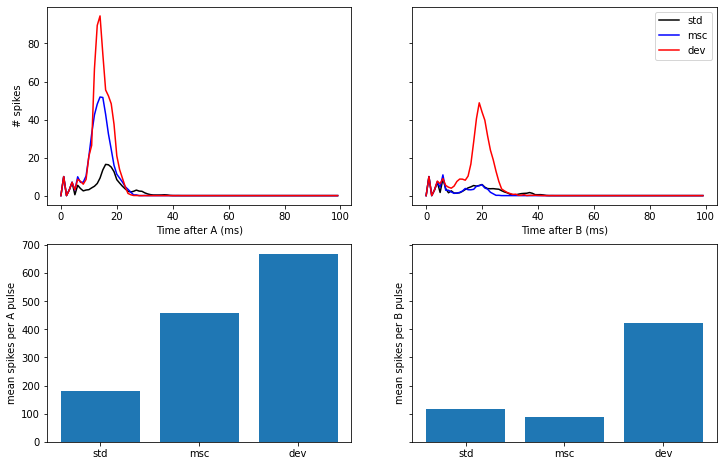

In [18]:
fig, axs = plt.subplots(2, 2, figsize=(12,8), sharex='row', sharey='row')
keys = ('std', 'msc', 'dev')
x = np.arange(stop=params['ISI'], step=params['dt'])/ms
for ax, stim in zip(axs[0], ('A', 'B')):
    for key, color in zip(keys, ('k', 'b', 'r')):
        ax.plot(x[:100], all_results[stim][key]['spike_hist'].sum(0)[:100], c=color, label=key)
    ax.set_xlabel(f'Time after {stim} (ms)')
axs[0,0].set_ylabel('# spikes')
axs[0,1].legend()

for ax, (target, results) in zip(axs[1], all_results.items()):
    ax.bar(keys, [results[key]['nspikes'].sum() for key in keys])
    ax.set_ylabel(f'mean spikes per {target} pulse')

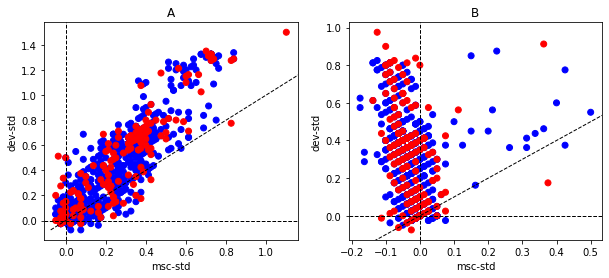

In [19]:
plt.figure(figsize=(10,4))
plt.subplot(121)
scatter_nspikes(params, all_results['A'])
plt.title('A')
plt.subplot(122)
scatter_nspikes(params, all_results['B'])
plt.title('B');

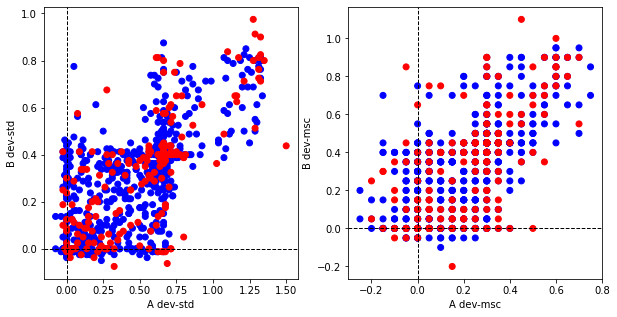

In [20]:
fig, axs = plt.subplots(1,2, figsize=(10,5))
colors = np.where(np.arange(params['N']) < params['N_exc'], np.asarray(['b']), np.asarray(['r']))
for ax, cond in zip(axs, ('std', 'msc')):
    ax.scatter(all_results['A']['dev']['nspikes'] - all_results['A'][cond]['nspikes'], all_results['B']['dev']['nspikes'] - all_results['B'][cond]['nspikes'], c=colors)
    ax.set_xlabel(f'A dev-{cond}')
    ax.set_ylabel(f'B dev-{cond}')
    ax.axhline(0, c='k', ls='--', lw=1)
    ax.axvline(0, c='k', ls='--', lw=1)

In [ ]:
raise InterruptedError

# Save the network

In [ ]:
np.savez(fname, W=W, X=X, Y=Y, D=D, A=A, B=B)
print(f'Saved structure to {fname}')

# Load the network

In [15]:
f = np.load(fname)
W, X, Y, D, A, B = [f[k] for k in 'WXYDAB']
X, Y = X*meter, Y*meter

# Dynamics run

In [16]:
device.reinit()
device.activate()
Net = model.create_network(X, Y, Xstim, Ystim, W, D, params, state_dt=params['dt'], reset_dt=inputs.get_episode_duration(params), extras=True)
all_results, T = readout.setup_run(Net, params, rng, {'A': A, 'B': B})
Net.run(T)

WARNING    OpenMP code is not yet well tested, and may be inaccurate. [brian2.devices.cpp_standalone.device.openmp]


In [17]:
readout.get_results(Net, params, W, all_results)

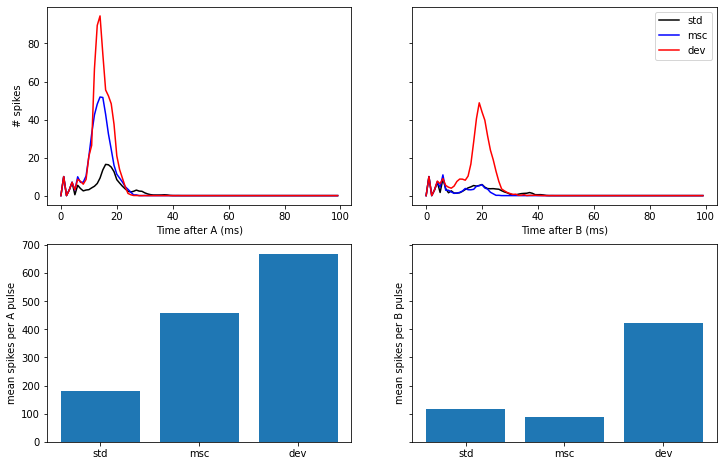

In [21]:
fig, axs = plt.subplots(2, 2, figsize=(12,8), sharex='row', sharey='row')
keys = ('std', 'msc', 'dev')
x = np.arange(stop=params['ISI'], step=params['dt'])/ms
for ax, stim in zip(axs[0], ('A', 'B')):
    for key, color in zip(keys, ('k', 'b', 'r')):
        ax.plot(x[:100], all_results[stim][key]['spike_hist'].sum(0)[:100], c=color, label=key)
    ax.set_xlabel(f'Time after {stim} (ms)')
axs[0,0].set_ylabel('# spikes')
axs[0,1].legend()

for ax, (target, results) in zip(axs[1], all_results.items()):
    ax.bar(keys, [results[key]['nspikes'].sum() for key in keys])
    ax.set_ylabel(f'mean spikes per {target} pulse')

# Input/Output

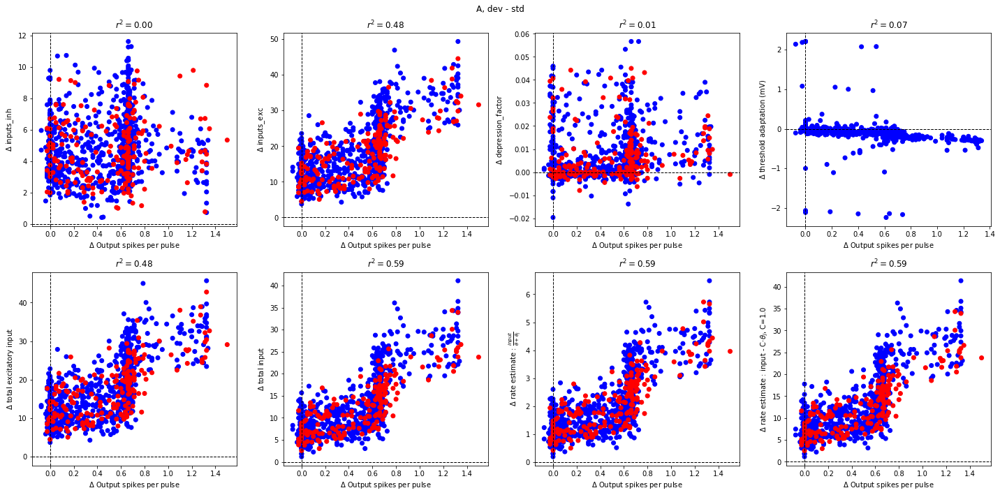

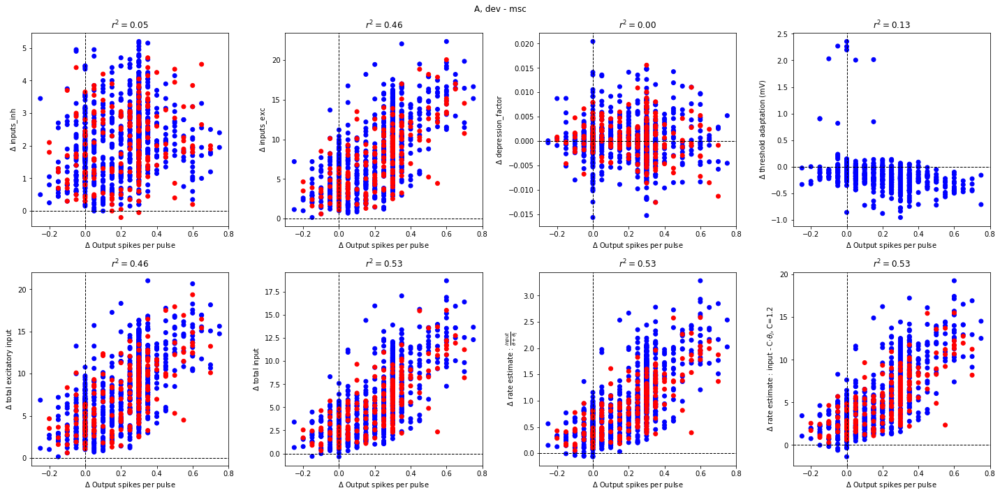

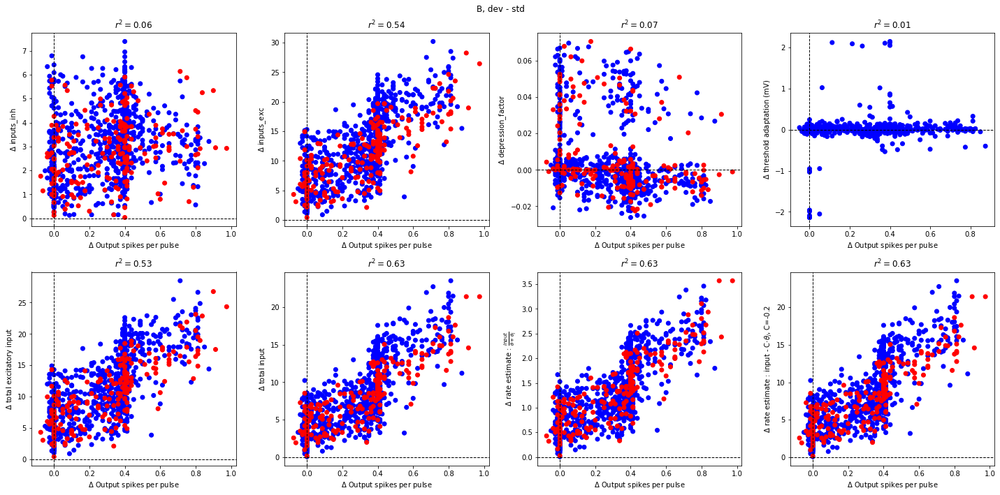

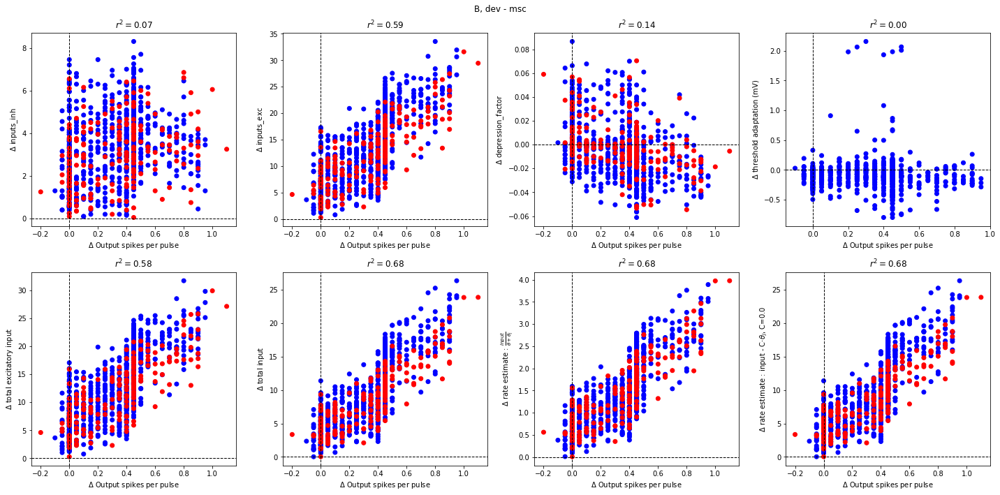

In [22]:
for target in ('A', 'B'):
    for key in ('std', 'dev', 'msc'):
        res = all_results[target][key]
        res['inputs_exc'], res['inputs_inh'], res['depression_factor'] = readout.quantify_presynaptic(
            W, params, res['spike_hist'], readout.get_infused_histogram(params, res, lambda r,p,i,t: r['xr'][i,p,t]).sum(1))
    for cond2 in ('std', 'msc'):
        scatter_IO(params, all_results, target, 'dev', cond2)

# Spike histograms

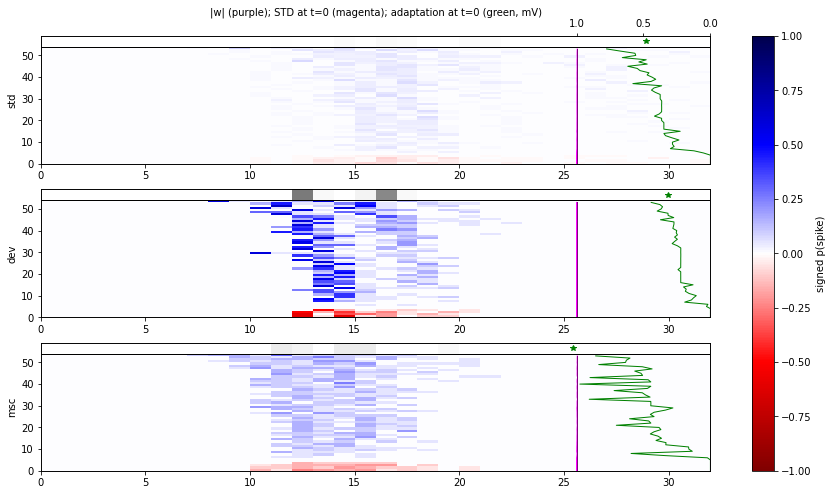

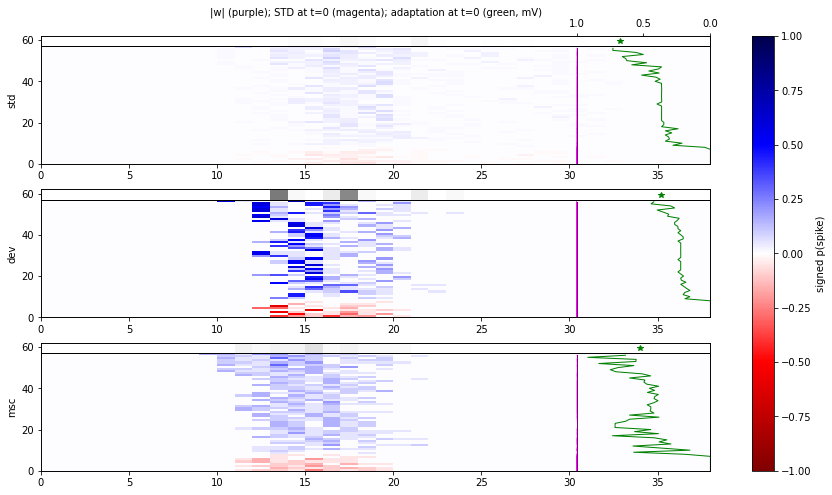

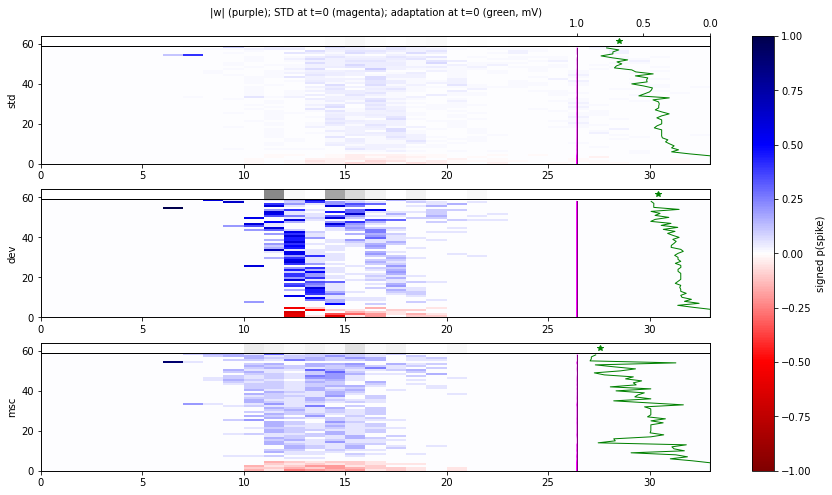

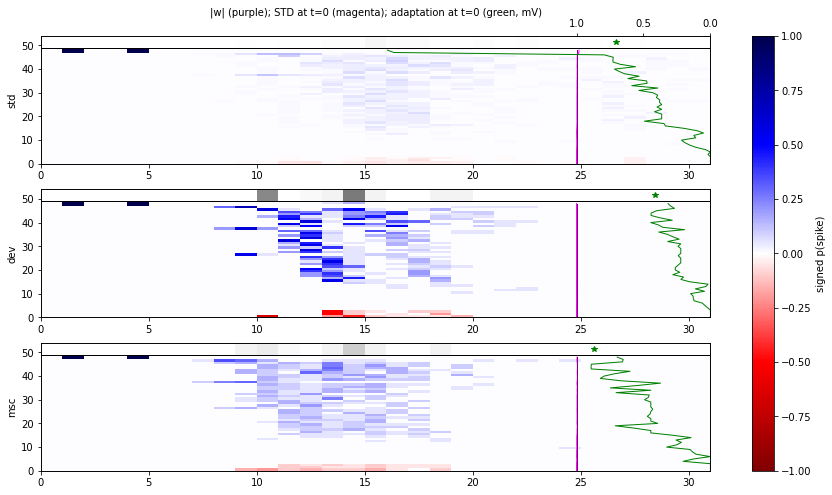

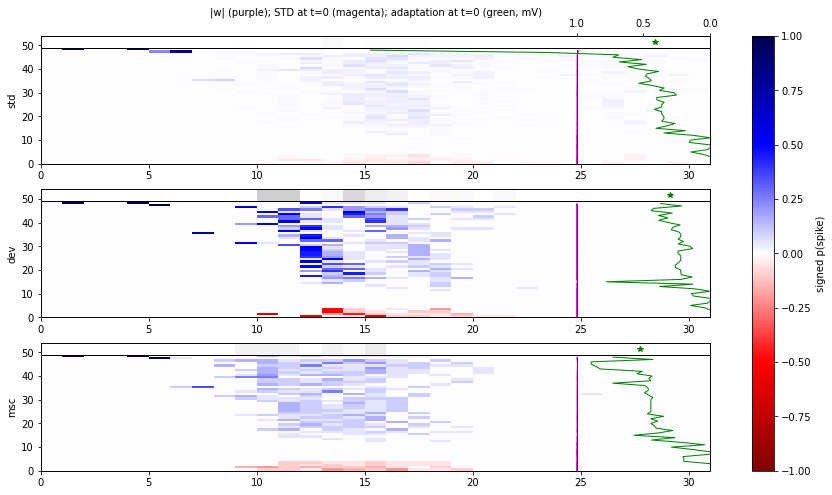

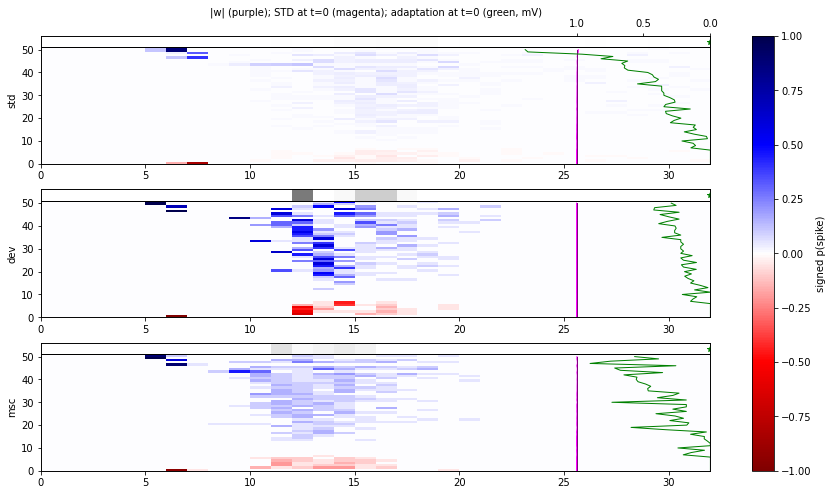

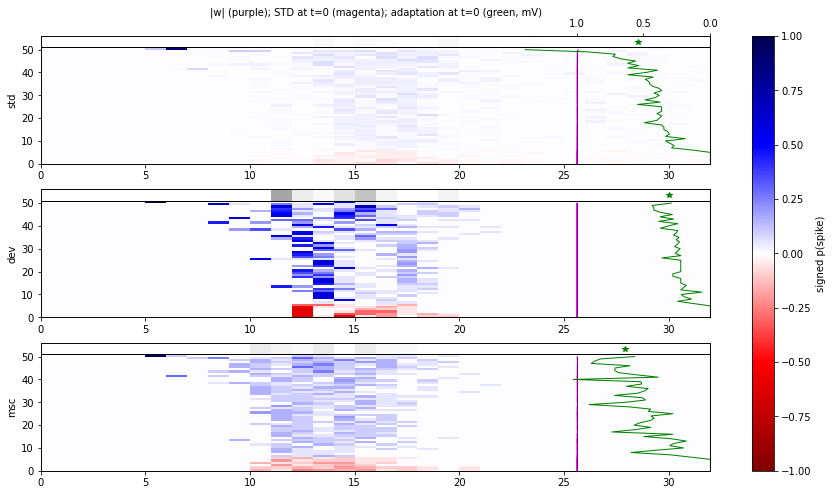

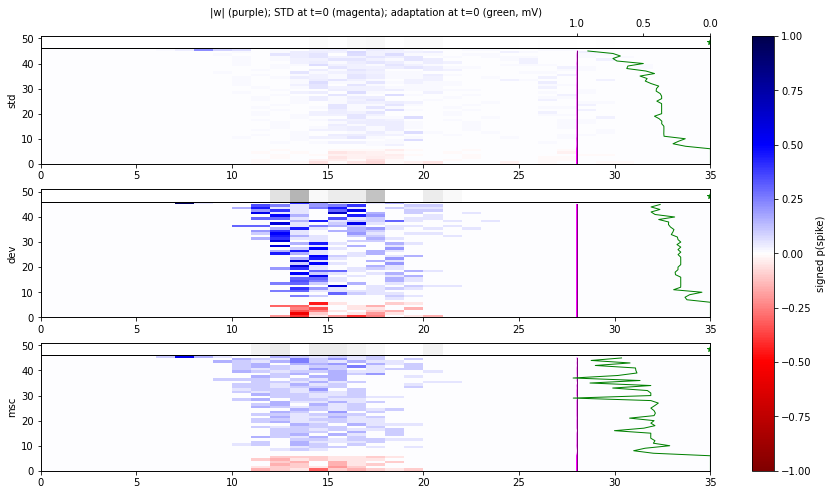

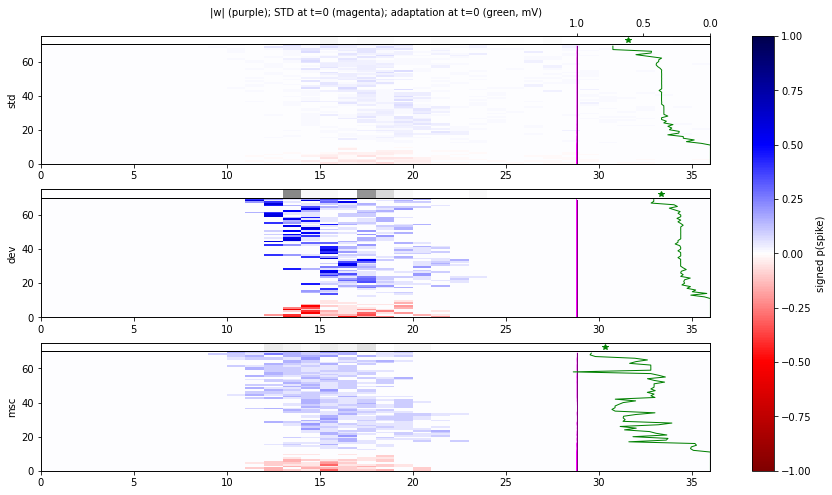

In [23]:
for i in np.argsort(all_results['A']['dev']['nspikes'] - all_results['A']['msc']['nspikes'])[-1:-10:-1]:
    plot_events(W, params, all_results['A'], i, figsize=(15,8))

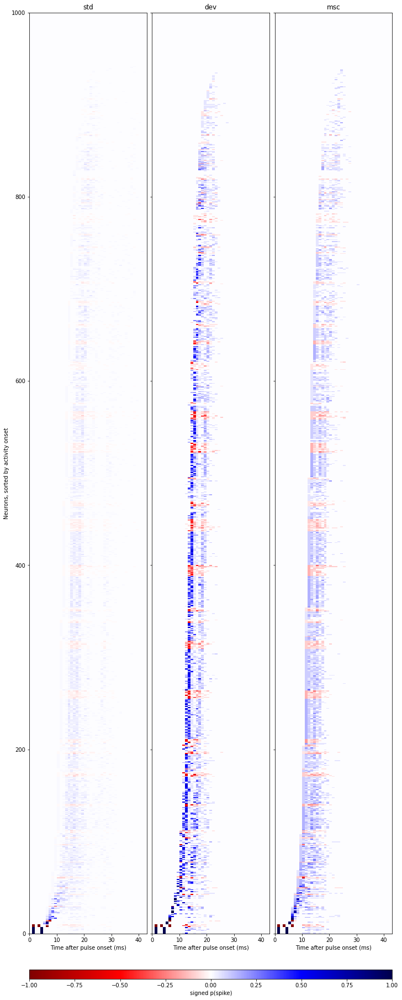

In [24]:
plot_population_spikehist(params, all_results['A'])

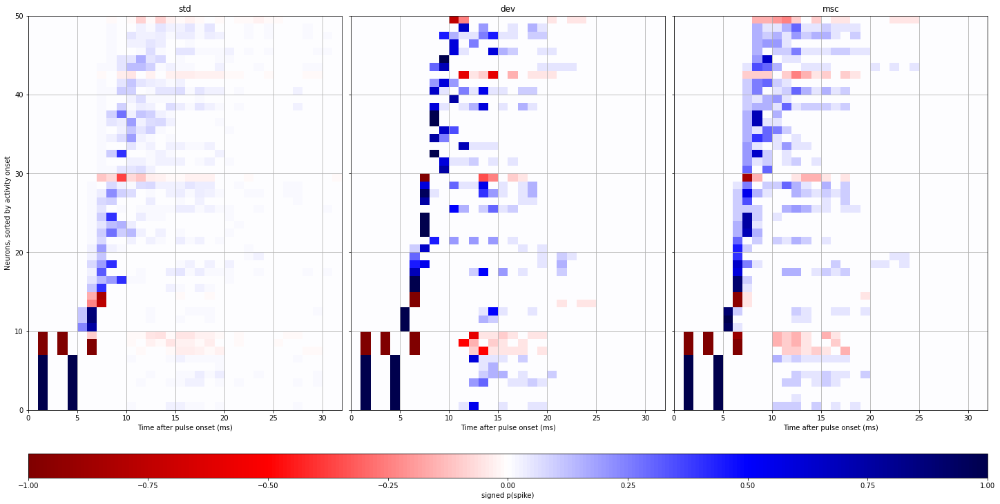

In [25]:
plot_population_spikehist(params, all_results['A'], earliest=50, figsize=(20,10), grid=True)

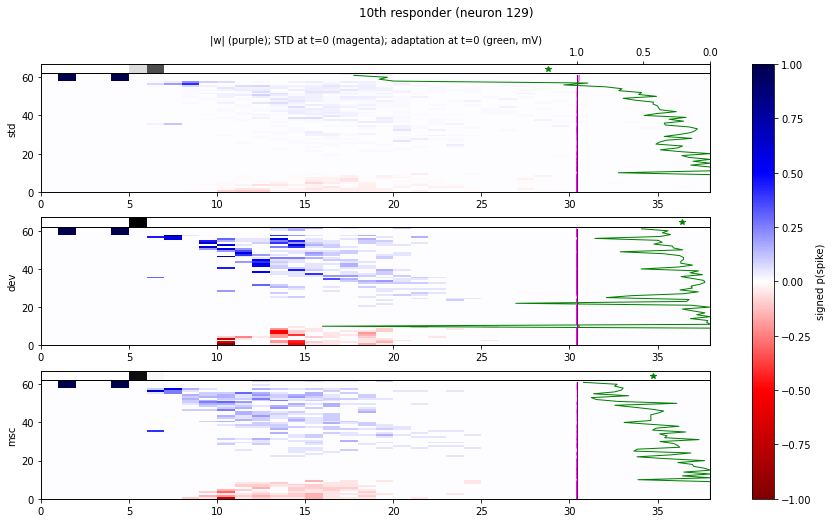

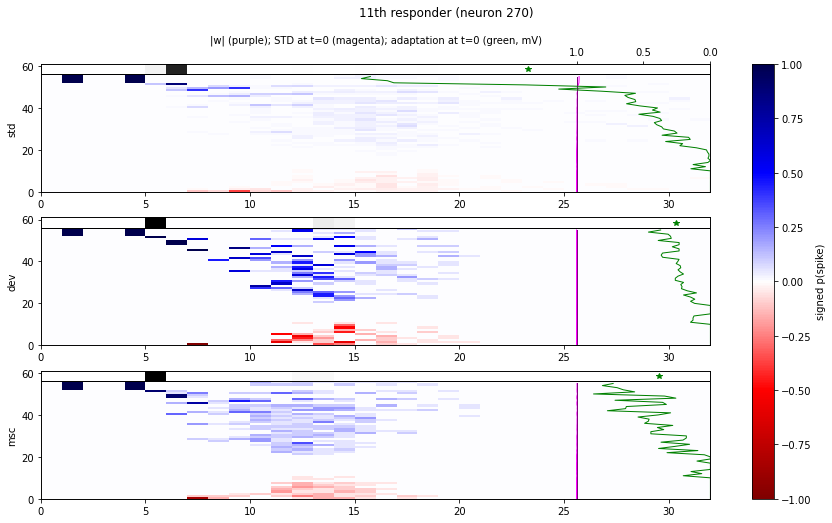

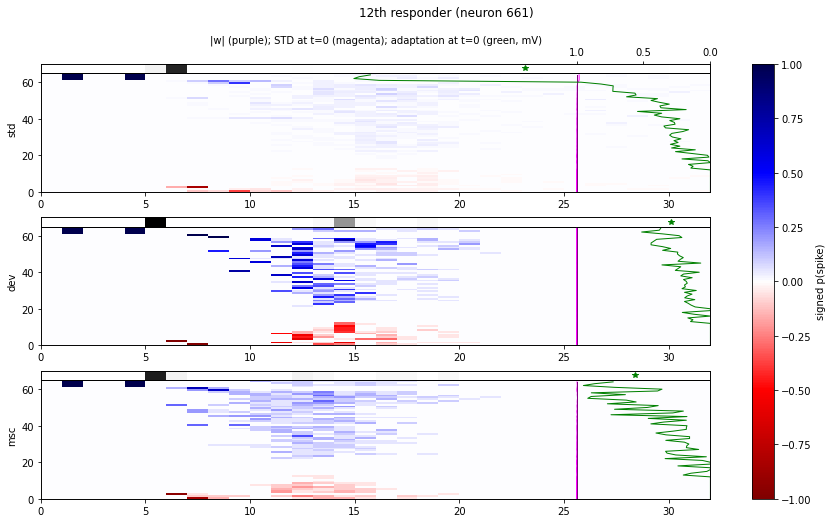

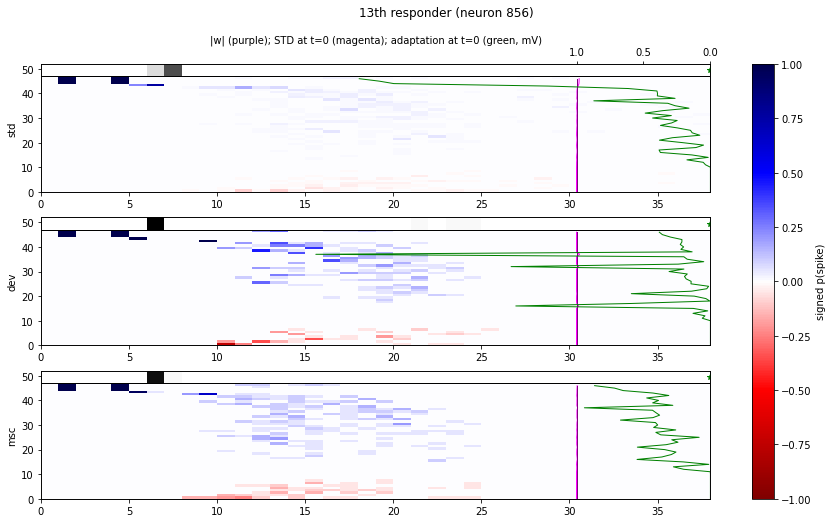

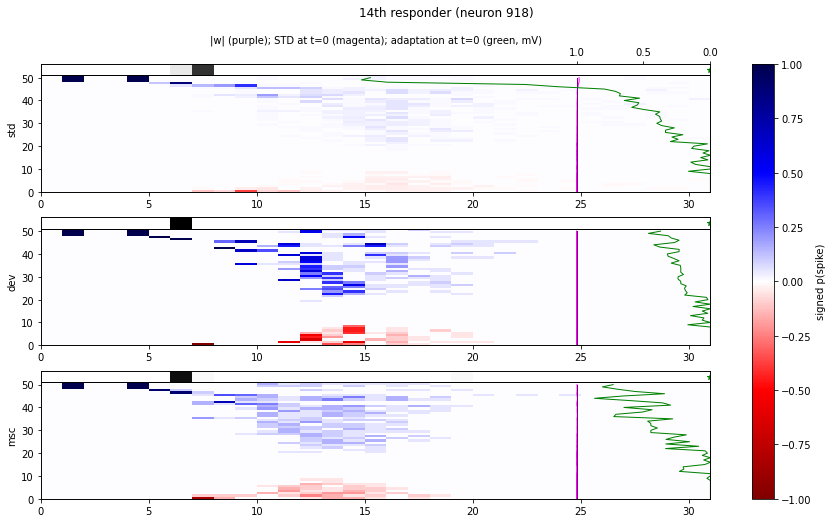

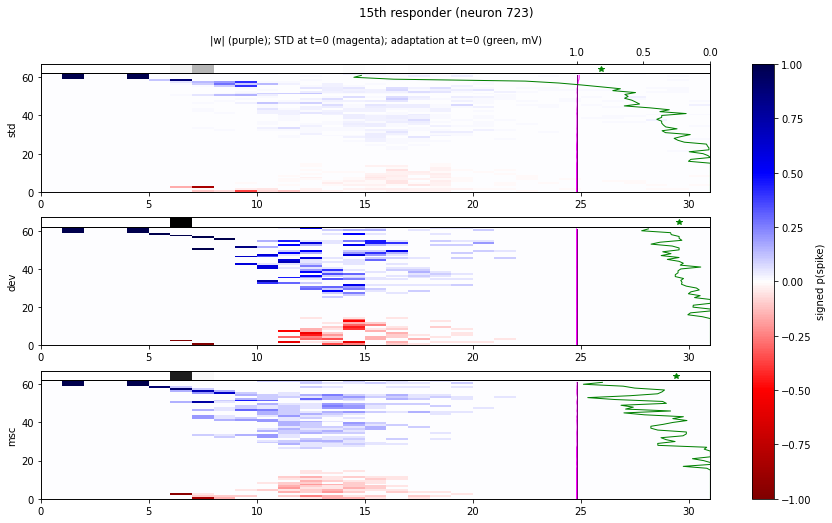

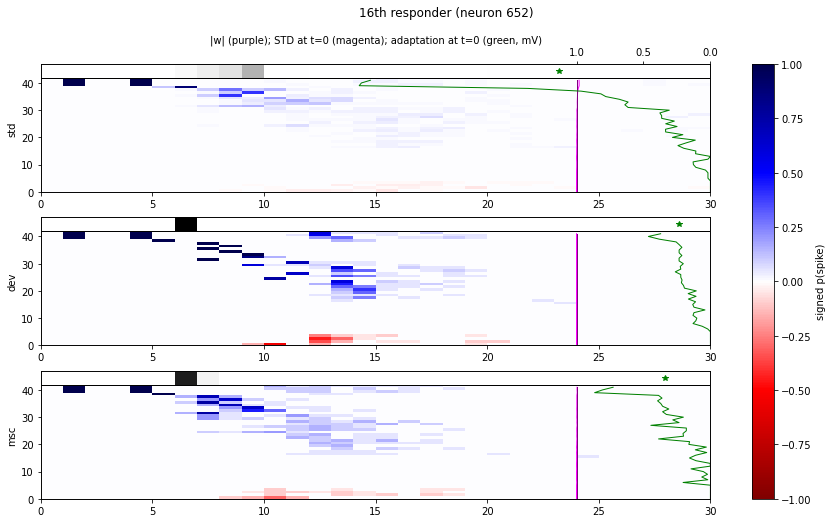

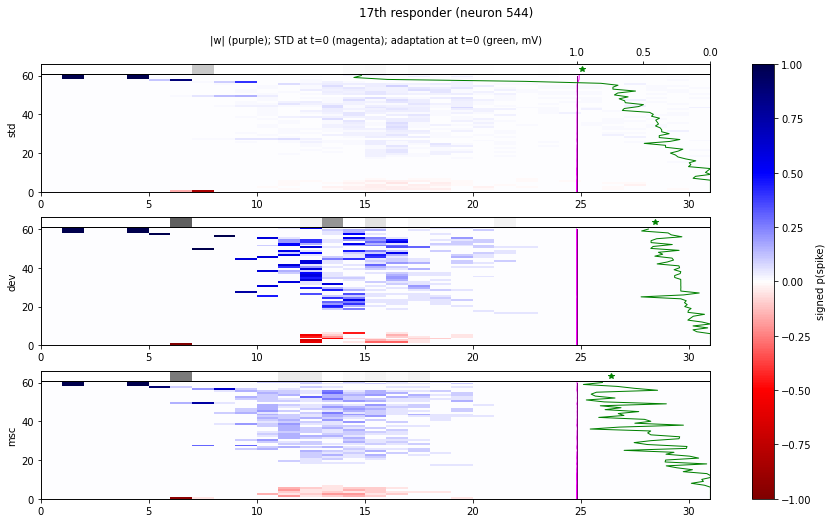

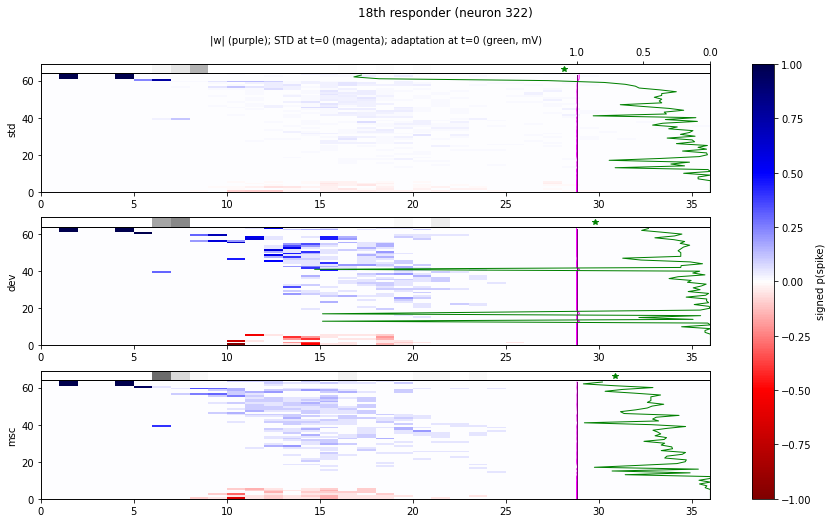

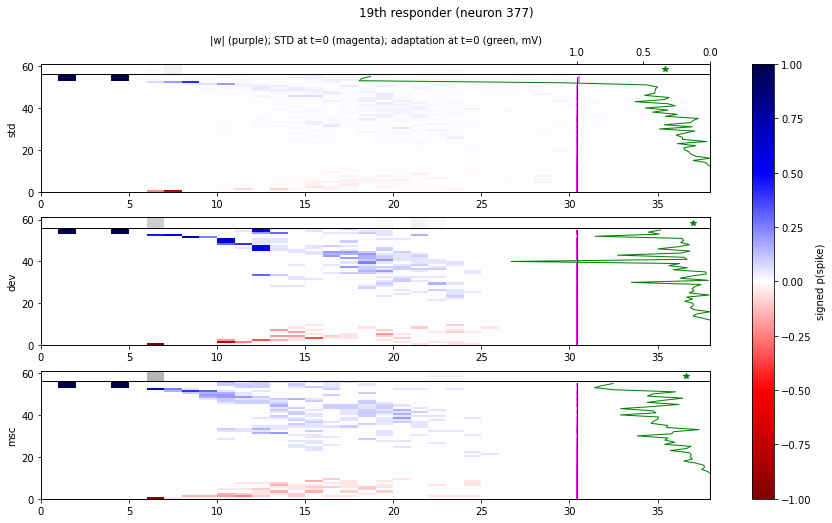

In [26]:
for j, i in enumerate(get_onset_ordering(all_results['A'], 20)[0][10:]):
    plot_events(W, params, all_results['A'], i, figsize=(15,8))
    plt.suptitle(f'{j+10}th responder (neuron {i})')

# Plasticity distributions

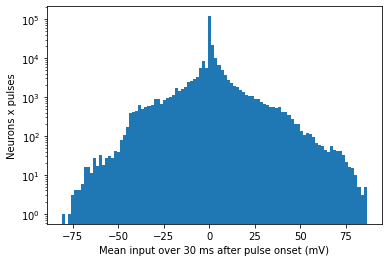

In [27]:
t_ = 30
out_ = []
for x in ('A', 'B'):
    notx = np.ones(params['N'], bool)
    notx[spatial.get_stimulated(X, Y, Xstim, Ystim, params)[all_results[x]['stimulus']]] = False
    out_.append((all_results[x]['std']['g_exc'][notx, :, :int(t_*ms/params['dt'] +.5)]*(params['E_exc']-params['v_rest'])
            + all_results[x]['std']['g_inh'][notx, :, :int(t_*ms/params['dt'] +.5)]*(params['E_inh']-params['v_rest'])
            ).mean(axis=2).flatten())
    out_.append((all_results[x]['dev']['g_exc'][notx, :, :int(t_*ms/params['dt'] +.5)]*(params['E_exc']-params['v_rest'])
            + all_results[x]['dev']['g_inh'][notx, :, :int(t_*ms/params['dt'] +.5)]*(params['E_inh']-params['v_rest'])
            ).mean(axis=2).flatten())
    out_.append((all_results[x]['msc']['g_exc'][notx, :, :int(t_*ms/params['dt'] +.5)]*(params['E_exc']-params['v_rest'])
            + all_results[x]['msc']['g_inh'][notx, :, :int(t_*ms/params['dt'] +.5)]*(params['E_inh']-params['v_rest'])
            ).mean(axis=2).flatten())
plt.hist(np.concatenate(out_)/mV, bins=100)
plt.semilogy()
plt.xlabel(f'Mean input over {t_} ms after pulse onset (mV)')
plt.ylabel('Neurons x pulses');

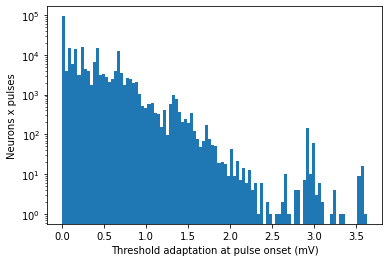

In [28]:
out_ = []
for x in ('A', 'B'):
    notx = np.ones(params['N'], bool)
    notx[spatial.get_stimulated(X, Y, Xstim, Ystim, params)[all_results[x]['stimulus']]] = False
    for key in ('std', 'dev', 'msc'):
        out_.append(all_results[x][key]['th_adapt'][notx, :, 0].flatten())
plt.hist(np.concatenate(out_) / mV, bins=100)
plt.semilogy()
plt.xlabel(f'Threshold adaptation at pulse onset (mV)')
plt.ylabel('Neurons x pulses');

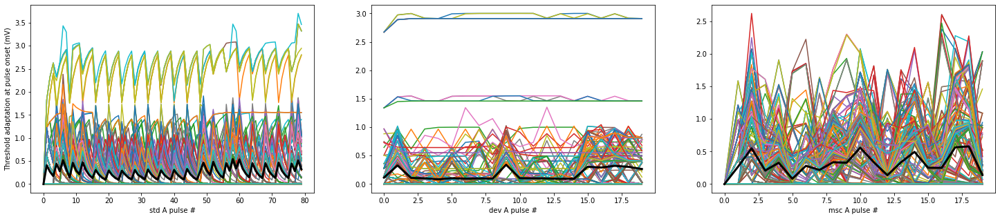

In [29]:
fig, axs = plt.subplots(1, 3, figsize=(25,5))
for key, ax in zip(('std', 'dev', 'msc'), axs):
    ax.plot(all_results['A'][key]['th_adapt'][:,:,0].T/mV)
    ax.plot(all_results['A'][key]['th_adapt'][:,:,0].mean(0).T/mV, lw=3, c='k')
    ax.set_xlabel(f'{key} A pulse #')
axs[0].set_ylabel('Threshold adaptation at pulse onset (mV)');

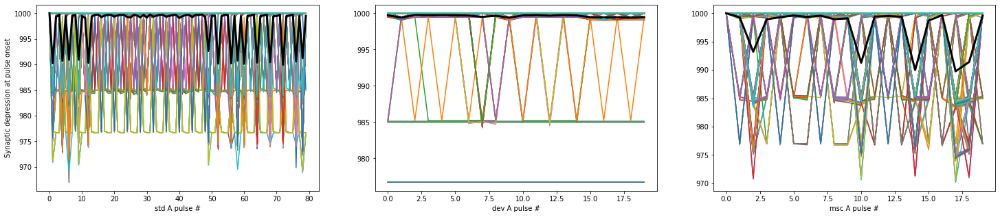

In [30]:
fig, axs = plt.subplots(1, 3, figsize=(25,5))
for key, ax in zip(('std', 'dev', 'msc'), axs):
    ax.plot(all_results['A'][key]['xr'][:,:,0].T/mV)
    ax.plot(all_results['A'][key]['xr'][:,:,0].mean(0).T/mV, lw=3, c='k')
    ax.set_xlabel(f'{key} A pulse #')
axs[0].set_ylabel('Synaptic depression at pulse onset');

# Spatial

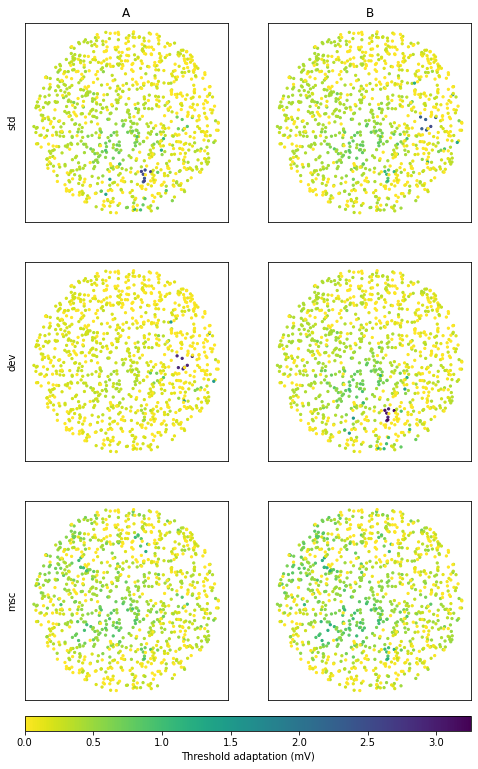

In [31]:
vmax = 0
for x in ('A', 'B'):
    for key in ('std', 'dev', 'msc'):
        vmax = max(vmax, all_results[x][key]['th_adapt'][..., 0].mean(1).max()/mV)

cm = plt.get_cmap('viridis_r')
cNorm  = mpl_colors.Normalize(vmin=0, vmax=vmax)
scalarMap = mpl_cm.ScalarMappable(norm=cNorm, cmap=cm)

fig, axgrid = plt.subplots(3, 2, figsize=(8,15))
for axs, key in zip(axgrid, ('std', 'dev', 'msc')):
    for ax, x in zip(axs, ('A', 'B')):
        ax.scatter(X, Y, c=scalarMap.to_rgba(all_results[x][key]['th_adapt'][..., 0].mean(1)/mV), s=5)
        ax.set_xticks([])
        ax.set_yticks([])
        if key=='std':
            ax.set_title(x)
    axs[0].set_ylabel(key)
plt.colorbar(scalarMap, location='bottom', ax=axgrid, aspect=30, label='Threshold adaptation (mV)', pad=.02)

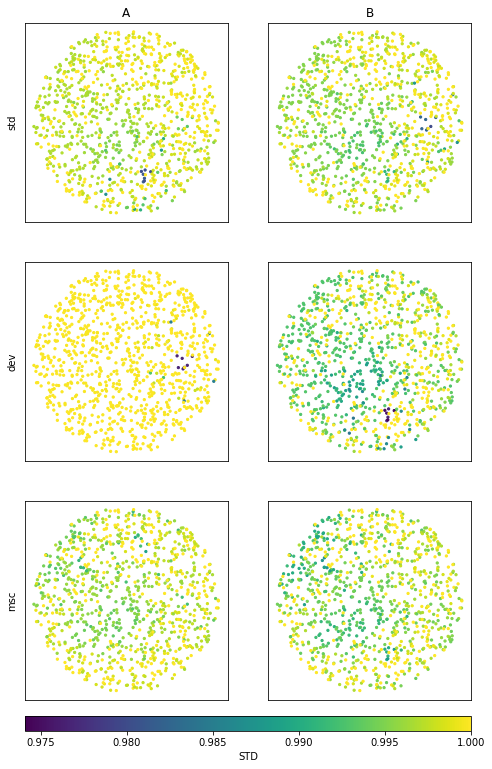

In [32]:
vmin = 1
for x in ('A', 'B'):
    for key in ('std', 'dev', 'msc'):
        vmin = min(vmin, all_results[x][key]['xr'][..., 0].mean(1).min())

cm = plt.get_cmap('viridis')
cNorm  = mpl_colors.Normalize(vmin=vmin, vmax=1)
scalarMap = mpl_cm.ScalarMappable(norm=cNorm, cmap=cm)

fig, axgrid = plt.subplots(3, 2, figsize=(8,15))
for axs, key in zip(axgrid, ('std', 'dev', 'msc')):
    for ax, x in zip(axs, ('A', 'B')):
        ax.scatter(X, Y, c=scalarMap.to_rgba(all_results[x][key]['xr'][..., 0].mean(1)), s=5)
        ax.set_xticks([])
        ax.set_yticks([])
        if key=='std':
            ax.set_title(x)
    axs[0].set_ylabel(key)
plt.colorbar(scalarMap, location='bottom', ax=axgrid, aspect=30, label='STD', pad=.02)

# Full-field contrasts

In [33]:
figsize=(10,10)
contrasts = ['std', 'msc']

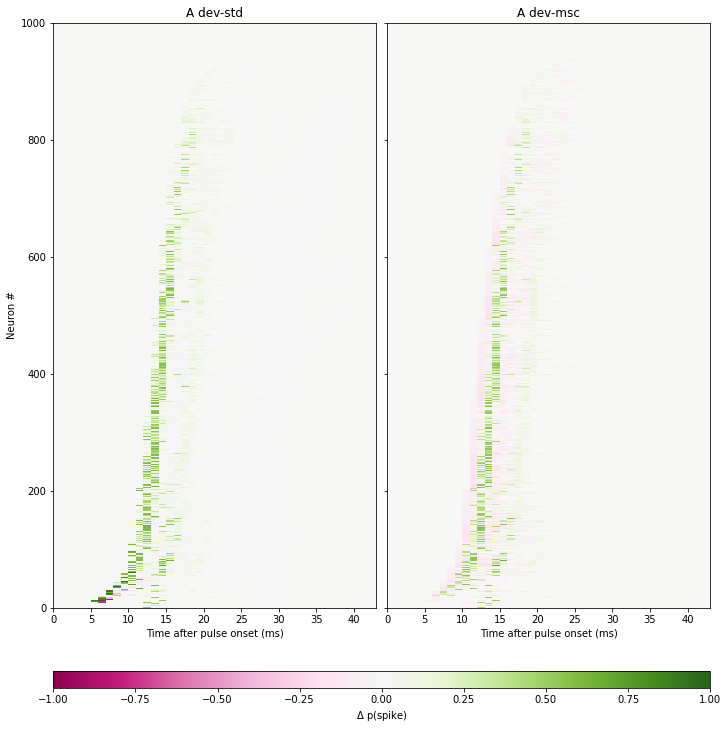

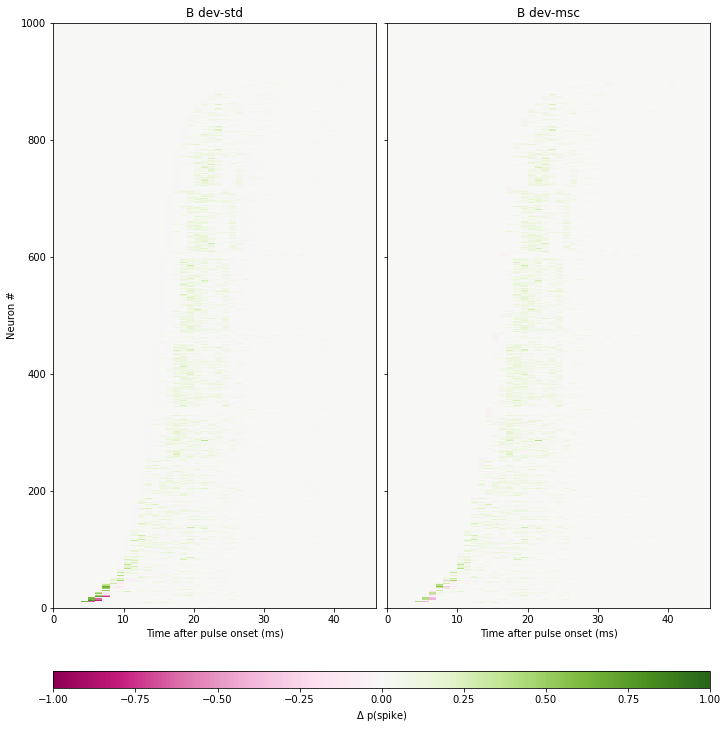

In [34]:
for identity in ['A', 'B']:
    fig, axs, cb = plot_population_time_contrast(params, all_results[identity], ['dev']*2, contrasts, 'spike_hist', figsize=figsize, vmax=1)
    cb.set_label(r'$\Delta$ p(spike)')
    for ax, contrast in zip(axs, contrasts):
        ax.set_title(f'{identity} dev-{contrast}')

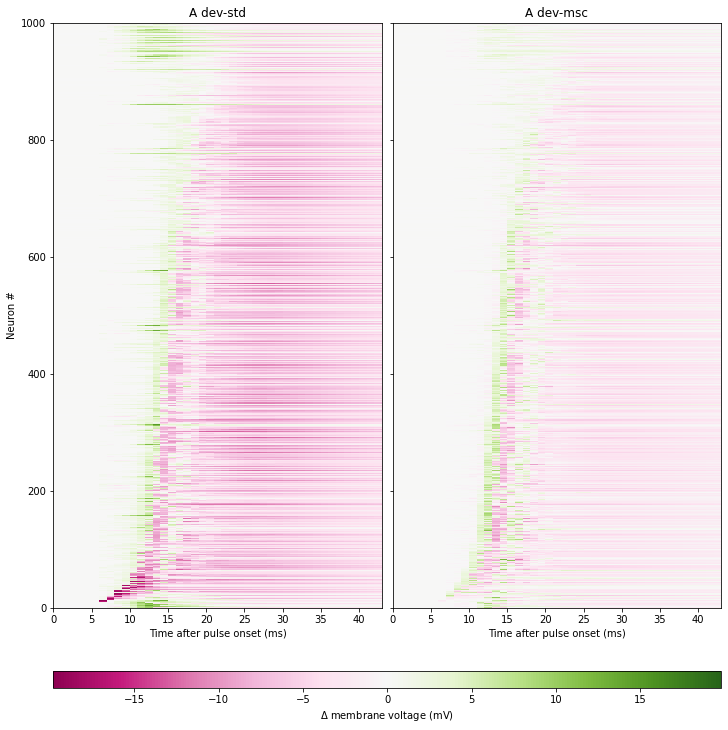

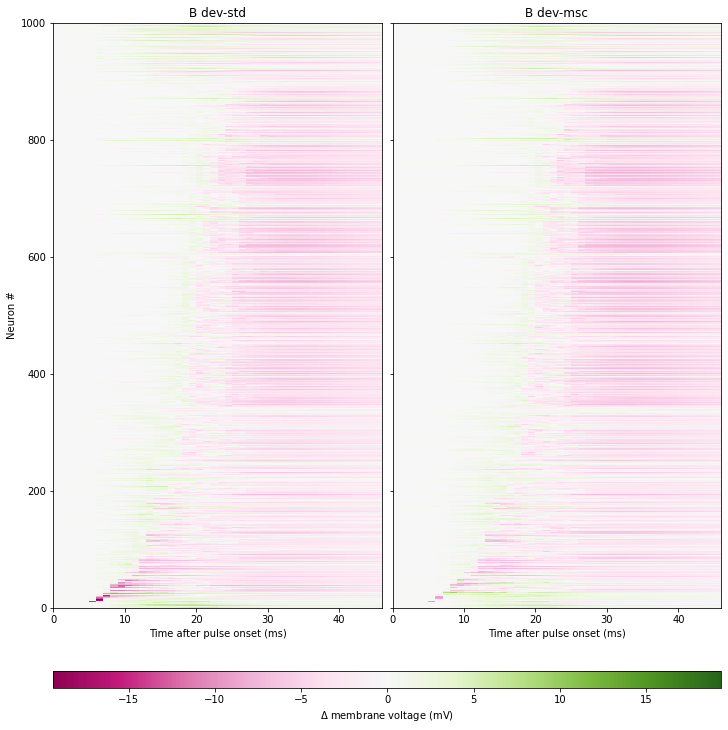

In [35]:
for identity in ['A', 'B']:
    fig, axs, cb = plot_population_time_contrast(params, all_results[identity], ['dev']*2, contrasts, 'v', mV, figsize=figsize)
    cb.set_label(r'$\Delta$ membrane voltage (mV)')
    for ax, contrast in zip(axs, contrasts):
        ax.set_title(f'{identity} dev-{contrast}')

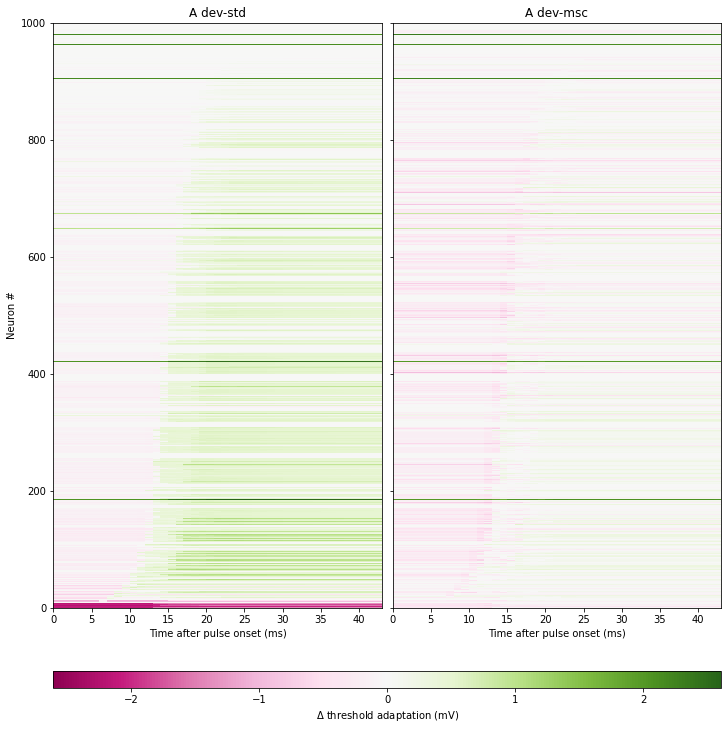

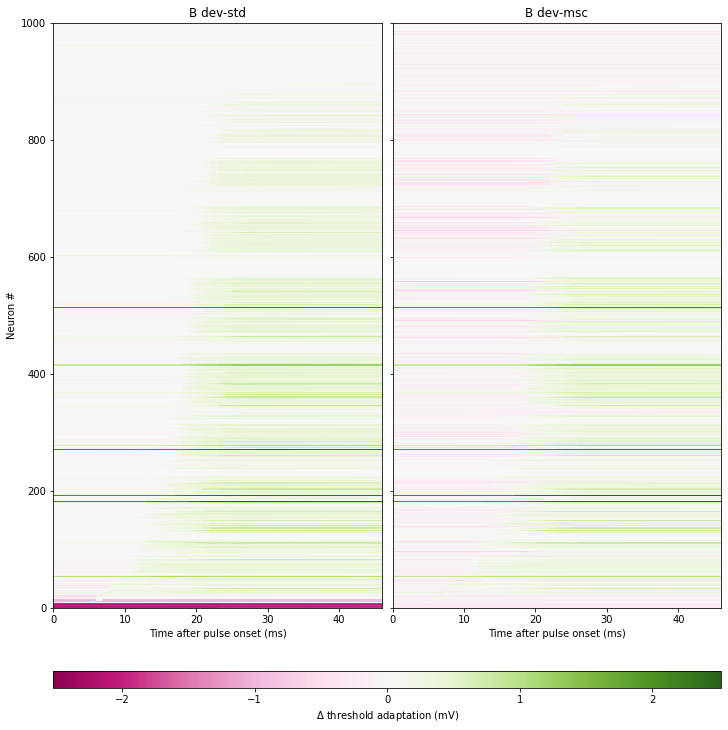

In [36]:
for identity in ['A', 'B']:
    fig, axs, cb = plot_population_time_contrast(params, all_results[identity], ['dev']*2, contrasts, 'th_adapt', mV, figsize=figsize)
    cb.set_label(r'$\Delta$ threshold adaptation (mV)')
    for ax, contrast in zip(axs, contrasts):
        ax.set_title(f'{identity} dev-{contrast}')

# Spike-triggered contrasts

In [37]:
def plot_lots(infusion, label, plain, contrasts, width, height, limit=None, norm_to_min=False, include_zeros=False, norm=True, ids=('A','B')):
    keys = ('std', 'dev', 'msc')
    for identity in ids:
        hists = {
            key: readout.get_infused_histogram(
                params, all_results[identity][key], infusion, norm=norm
            )
            for key in keys}
        if not include_zeros:
            for h in hists.values():
                h[h == 0] = np.nan
        hist_diff_nonorm = [hists[c0] - hists[c1] for c0, c1 in contrasts]
        if norm_to_min:
            hmin = min([np.nanmin(h) for h in hists.values()])
        else:
            hmin = 0
        hist_diff_pixelnorm = [(hists[c0] - hists[c1])/(hists[c0]+hists[c1]-2*hmin) for c0, c1 in contrasts]
        if include_zeros:
            for h in hists.values():
                h[h == 0] = np.nan
        
        fig, axs, cb = plot_pulse_hist(all_results[identity], list({k:hists[k] for k in plain}.values()),
                                       figsize=(width*len(plain), height), symmetric=False, cmap='viridis_r',
                                       limit=limit)
        cb.set_label(label)
        for ax, key in zip(axs, plain):
            ax.set_title(f'{identity} {key}')

        fig, axs, cb = plot_pulse_hist(all_results[identity], hist_diff_nonorm, figsize=(width*len(contrasts), height), limit=limit)
        cb.set_label(f'Unnormalised $\\Delta$ {label}')
        for ax, (c0, c1) in zip(axs, contrasts):
            ax.set_title(f'{identity} {c0}-{c1}')

        fig, axs, cb = plot_pulse_hist(all_results[identity], hist_diff_pixelnorm, figsize=(width*len(contrasts), height), limit=limit)
        cb.set_label(f'Pixel norm $\\Delta$ {label}')
        for ax, (c0, c1) in zip(axs, contrasts):
            ax.set_title(f'{identity} {c0}-{c1}')

        fig, axs = plt.subplots(ncols=len(contrasts), figsize=(width*len(contrasts), 5), constrained_layout=True, sharex=True, sharey=True, squeeze=False)
        axs=axs[0]
        selection, tmax = get_onset_ordering(all_results[identity], limit=limit)
        for ax, hist in zip(axs, hist_diff_pixelnorm):
            ax.plot(time(np.arange(tmax)), np.nanmean(np.abs(hist[selection, :tmax]), 0))
            ax.set_xlabel('Time (ms)')
            ax.set_xlim(0,tmax)
        axs[0].set_ylabel(f'Mean abs pixel norm $\\Delta$ {label}')

## Full population

In [38]:
plain = ('std', 'dev', 'msc')
contrasts = [('dev', 'msc'), ('msc', 'std')]
width, height = 5, 10

WARNING    /tmp/ipykernel_1415059/2686837671.py:17: RuntimeWarning: invalid value encountered in true_divide
  hist_diff_pixelnorm = [(hists[c0] - hists[c1])/(hists[c0]+hists[c1]-2*hmin) for c0, c1 in contrasts]
 [py.warnings]
WARNING    /tmp/ipykernel_1415059/2686837671.py:43: RuntimeWarning: Mean of empty slice
  ax.plot(time(np.arange(tmax)), np.nanmean(np.abs(hist[selection, :tmax]), 0))
 [py.warnings]


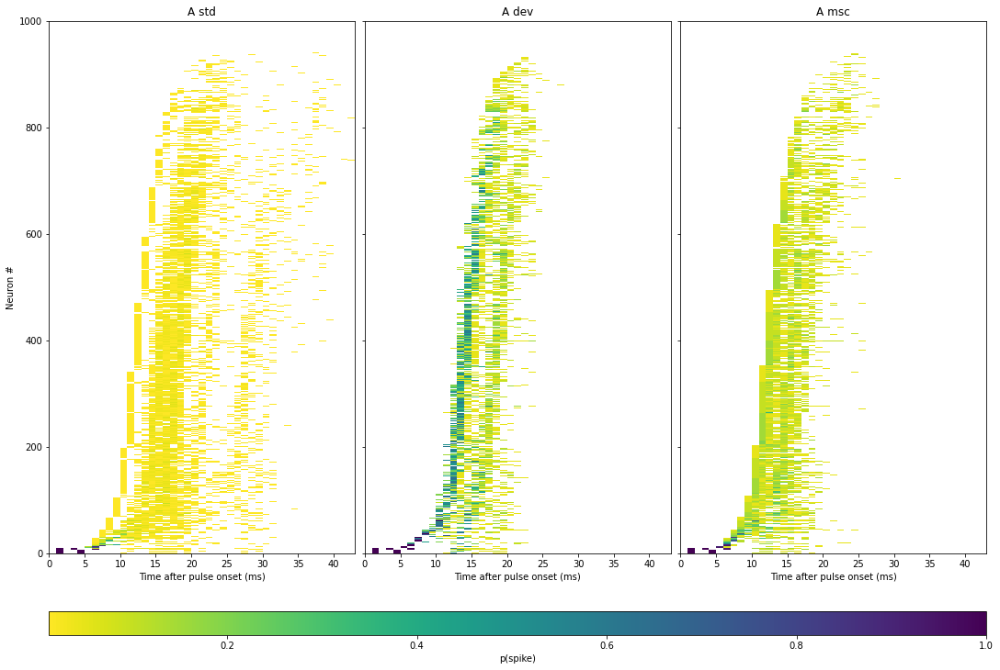

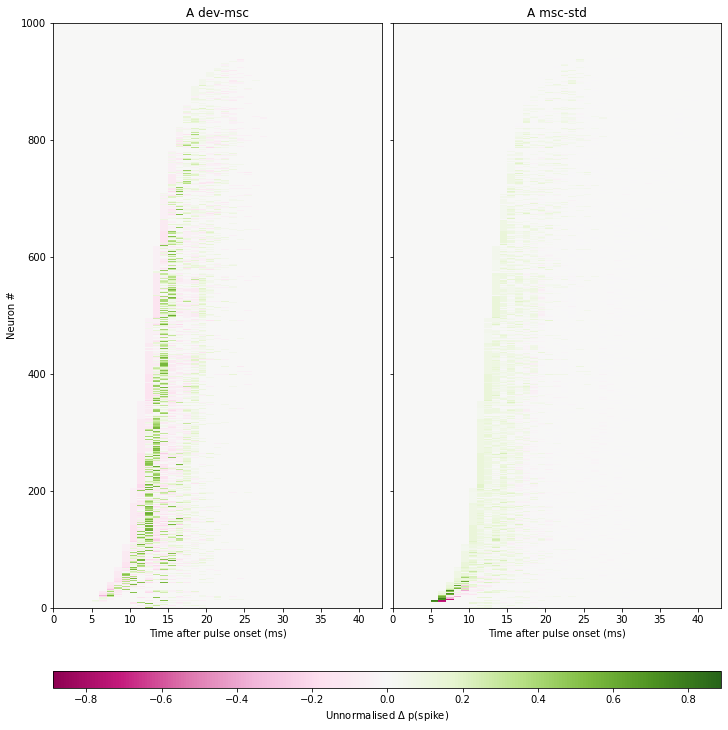

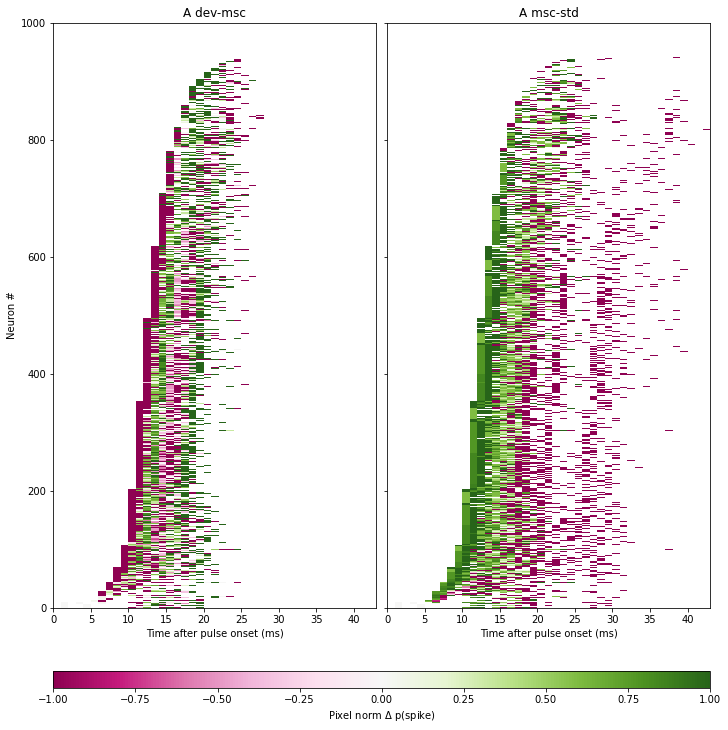

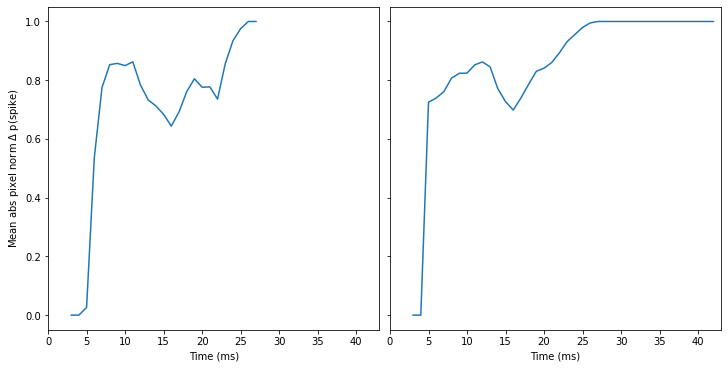

In [39]:
plot_lots(lambda r,i,p,t: 1, 'p(spike)', plain, contrasts, width, height, include_zeros=True, norm=False, ids=('A'))

WARNING    /tmp/ipykernel_1415059/2686837671.py:43: RuntimeWarning: Mean of empty slice
  ax.plot(time(np.arange(tmax)), np.nanmean(np.abs(hist[selection, :tmax]), 0))
 [py.warnings]


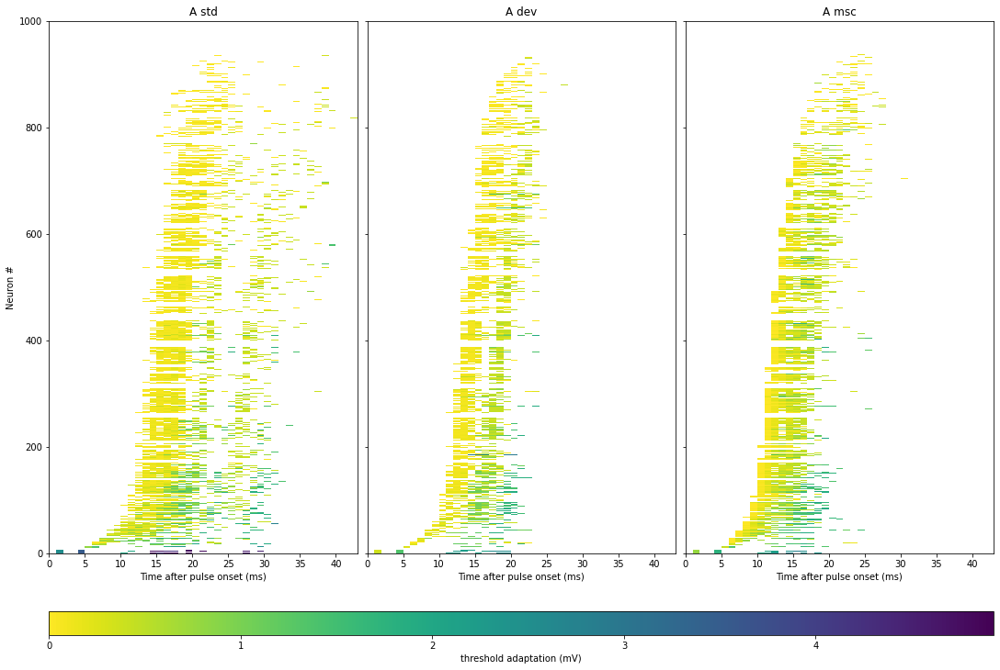

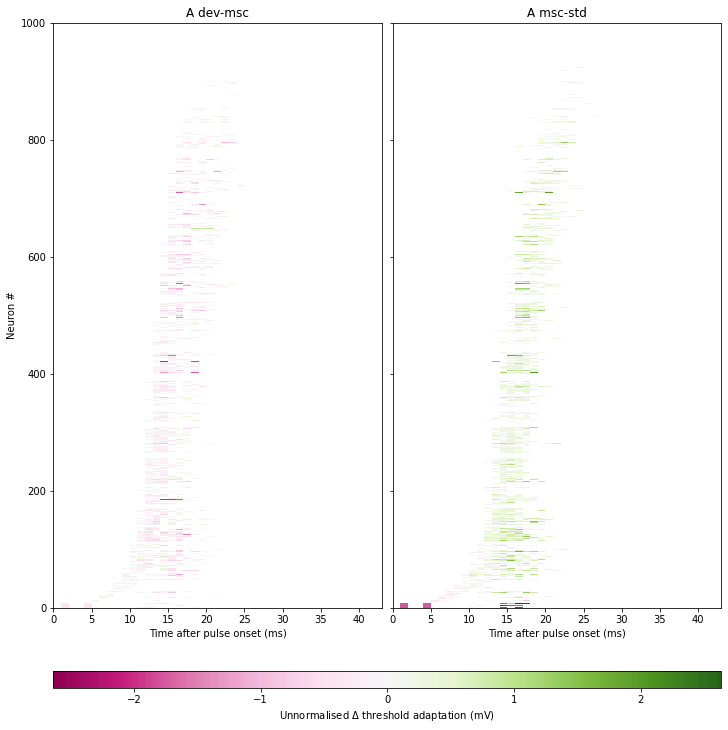

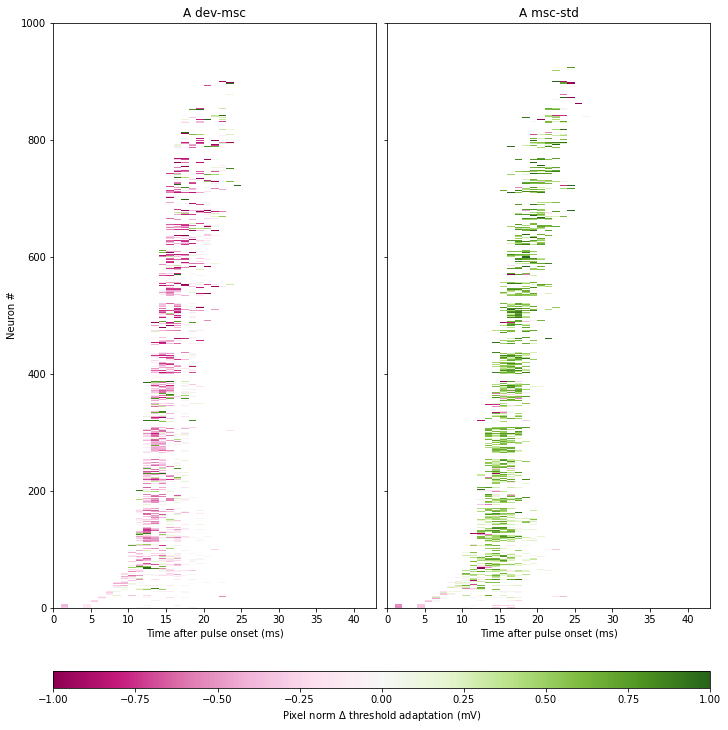

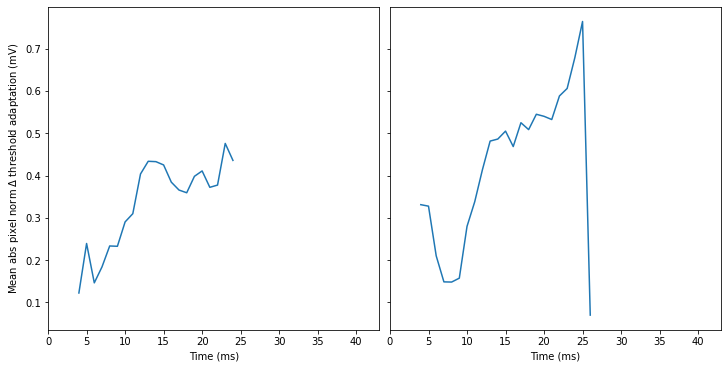

In [40]:
plot_lots(lambda r,p,i,t: r['th_adapt'][i,p,t]/mV, 'threshold adaptation (mV)', plain, contrasts, width, height, ids=('A'))

WARNING    /tmp/ipykernel_1415059/2686837671.py:43: RuntimeWarning: Mean of empty slice
  ax.plot(time(np.arange(tmax)), np.nanmean(np.abs(hist[selection, :tmax]), 0))
 [py.warnings]


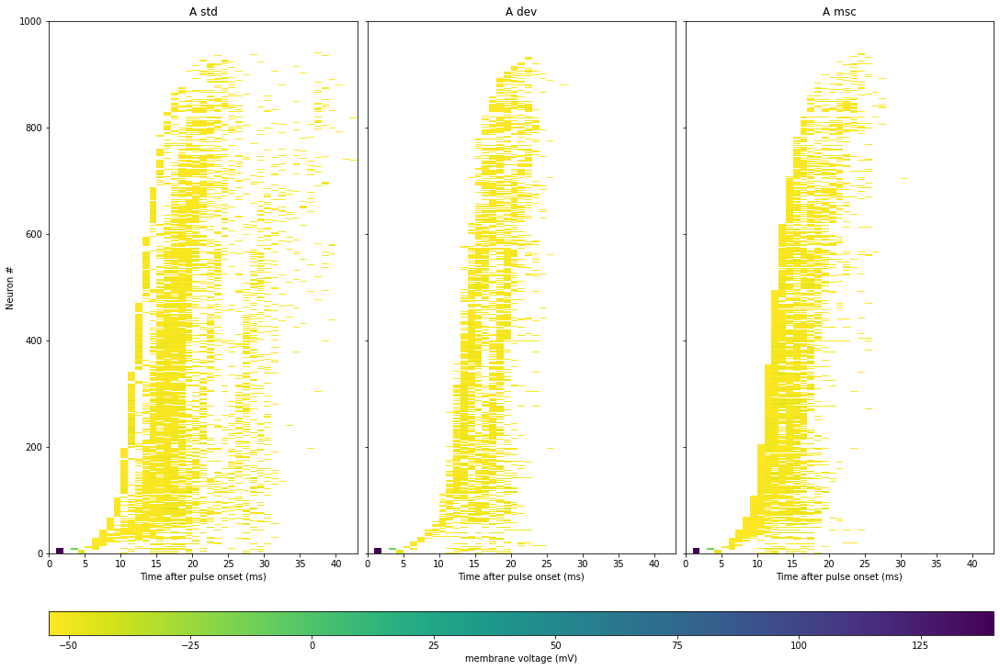

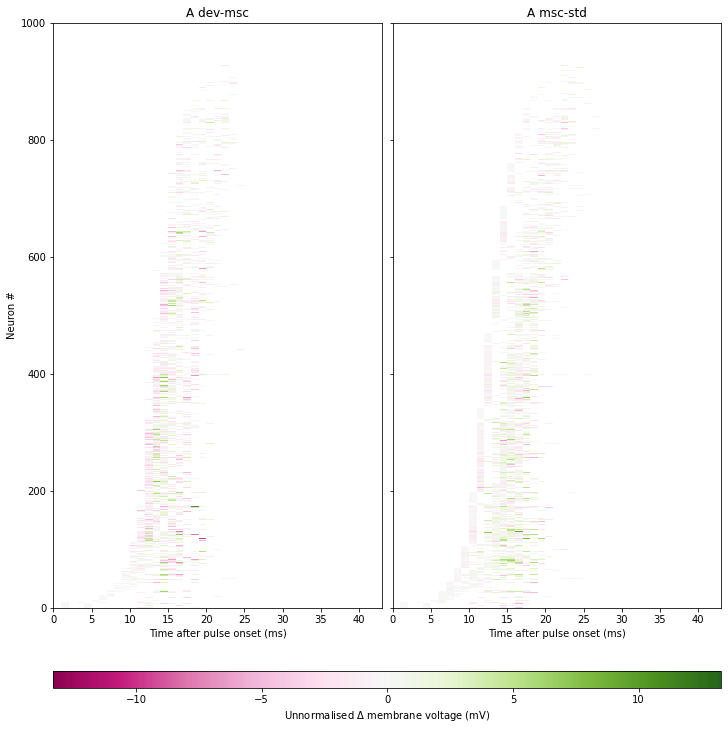

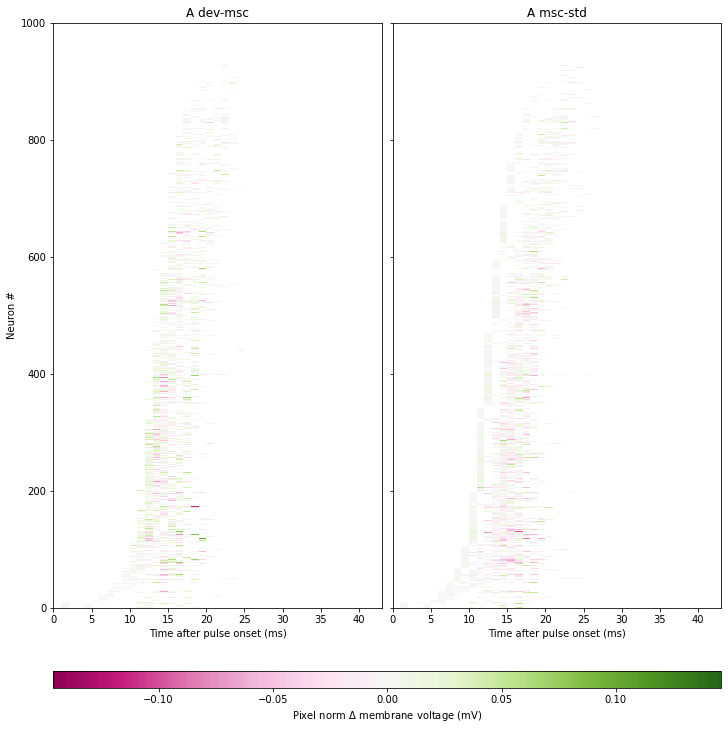

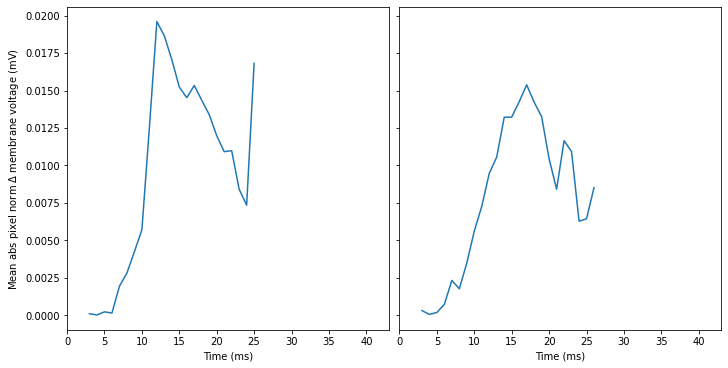

In [41]:
plot_lots(lambda r,p,i,t: r['v'][i,p,t]/mV, 'membrane voltage (mV)', plain, contrasts, width, height, ids=('A'))

WARNING    /tmp/ipykernel_1415059/2686837671.py:43: RuntimeWarning: Mean of empty slice
  ax.plot(time(np.arange(tmax)), np.nanmean(np.abs(hist[selection, :tmax]), 0))
 [py.warnings]


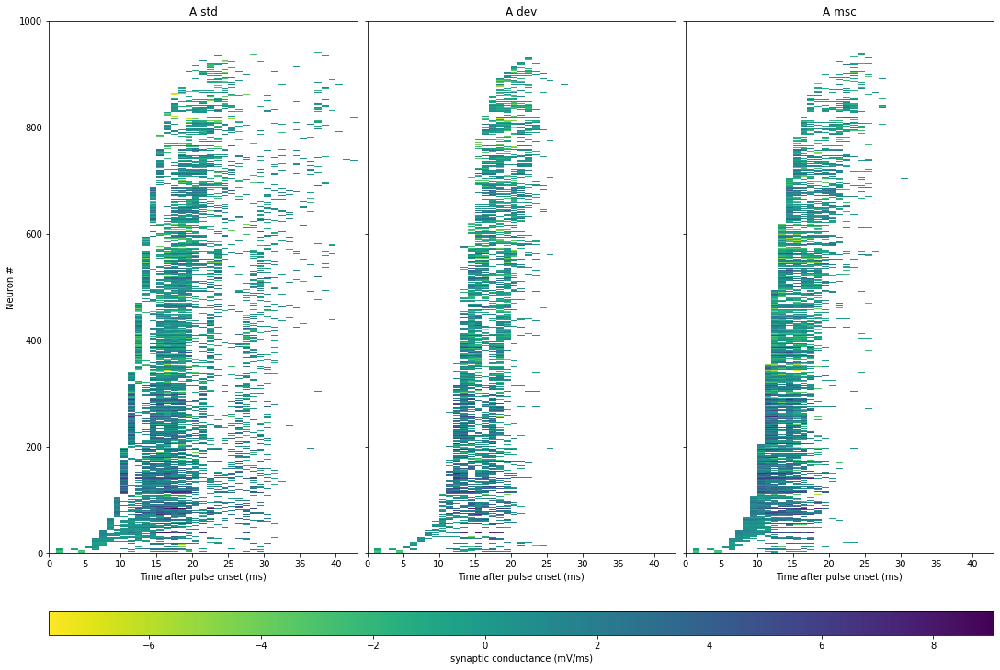

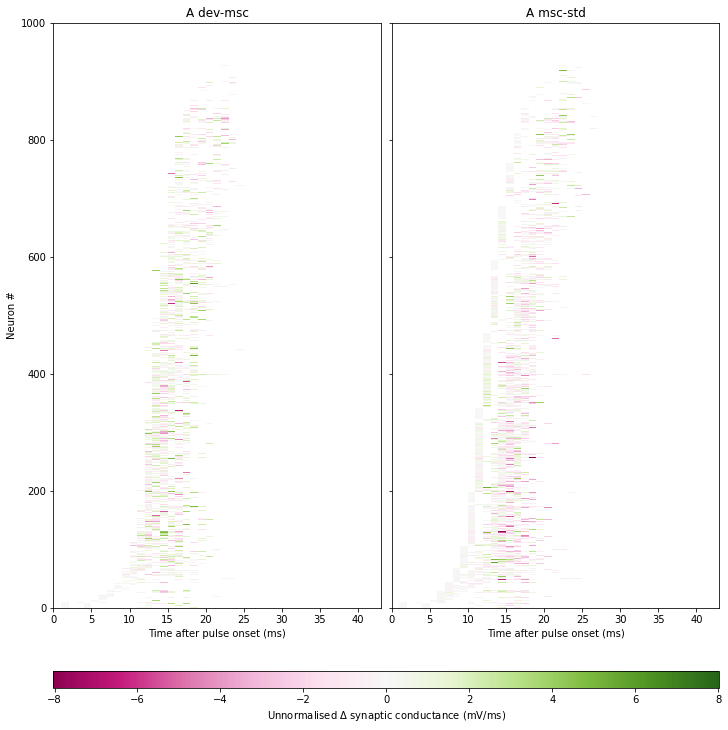

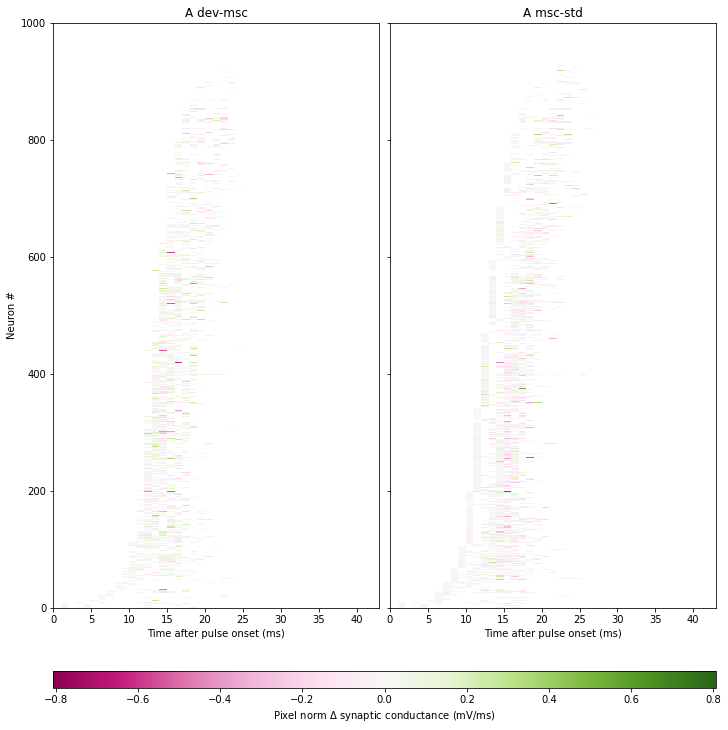

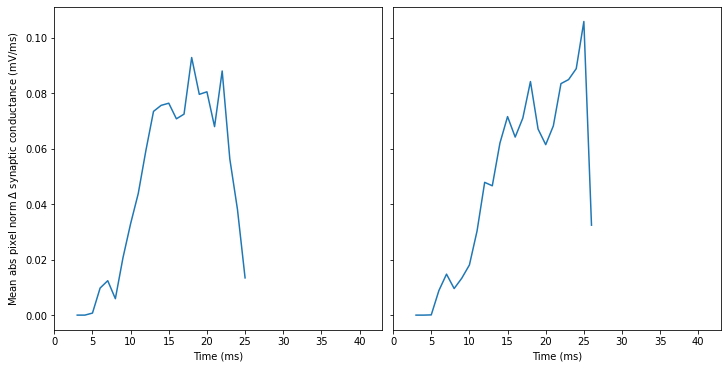

In [42]:
plot_lots(lambda r,p,i,t: r['g_exc_nox'][i,p,t] - r['g_inh'][i,p,t], 'synaptic conductance (mV/ms)', plain, contrasts, width, height, norm_to_min=True, ids=('A'))

WARNING    /tmp/ipykernel_1415059/2686837671.py:43: RuntimeWarning: Mean of empty slice
  ax.plot(time(np.arange(tmax)), np.nanmean(np.abs(hist[selection, :tmax]), 0))
 [py.warnings]


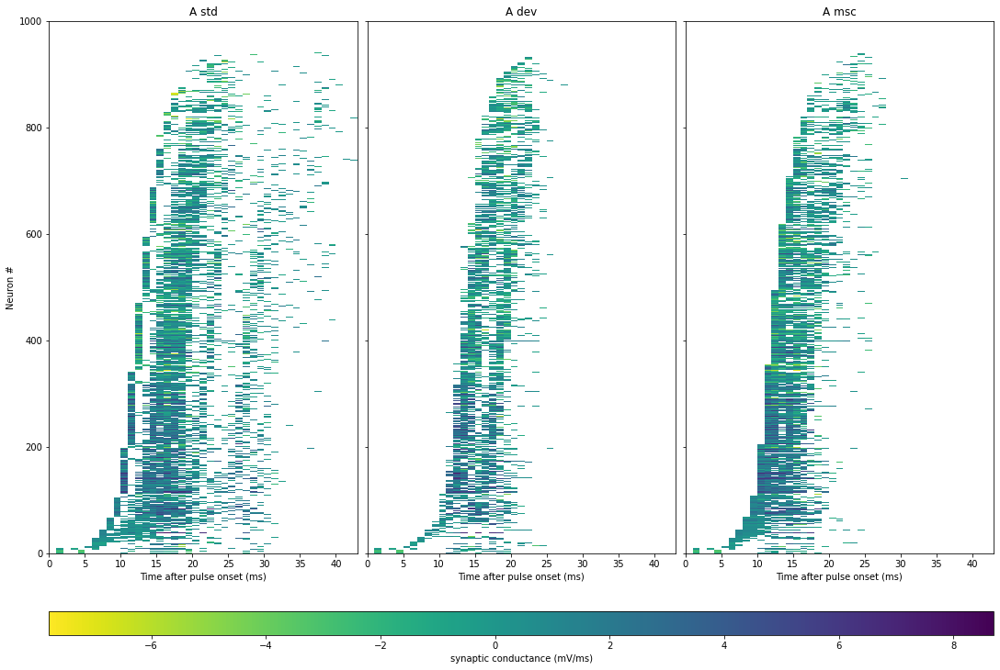

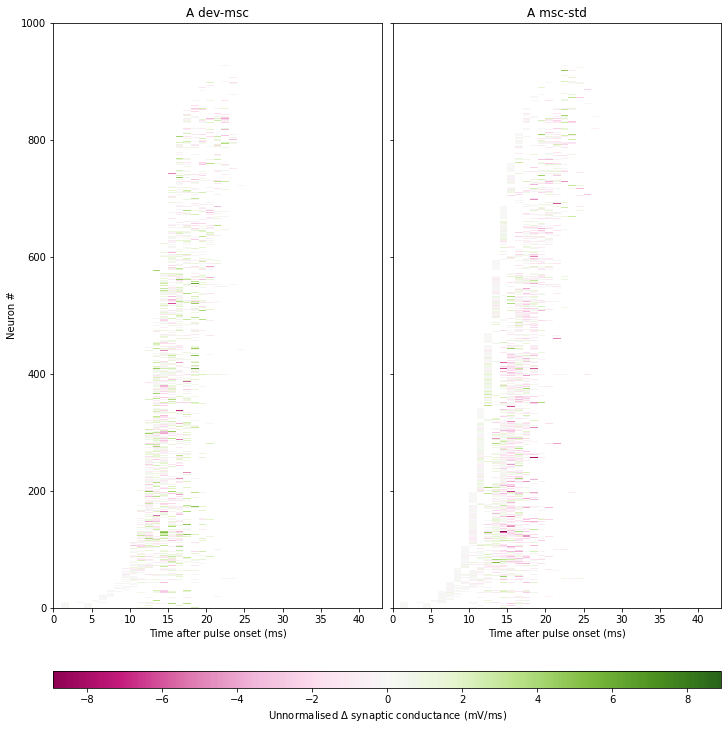

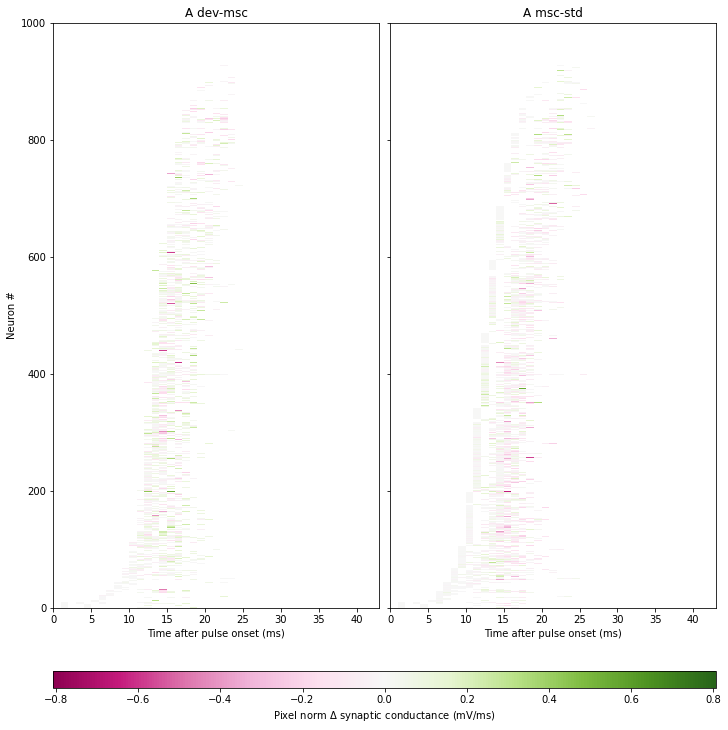

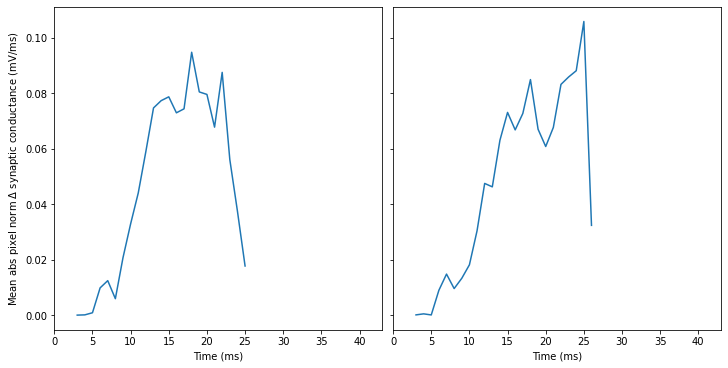

In [43]:
plot_lots(lambda r,p,i,t: r['g_exc'][i,p,t] - r['g_inh'][i,p,t], 'synaptic conductance (mV/ms)', plain, contrasts, width, height, norm_to_min=True, ids=('A'))

WARNING    /tmp/ipykernel_1415059/2686837671.py:43: RuntimeWarning: Mean of empty slice
  ax.plot(time(np.arange(tmax)), np.nanmean(np.abs(hist[selection, :tmax]), 0))
 [py.warnings]


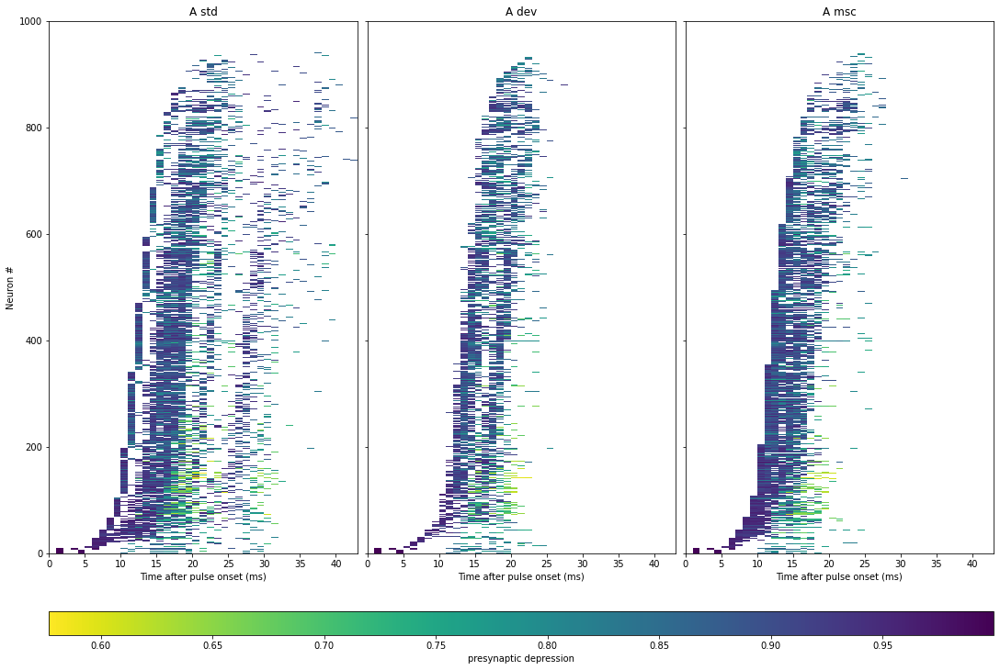

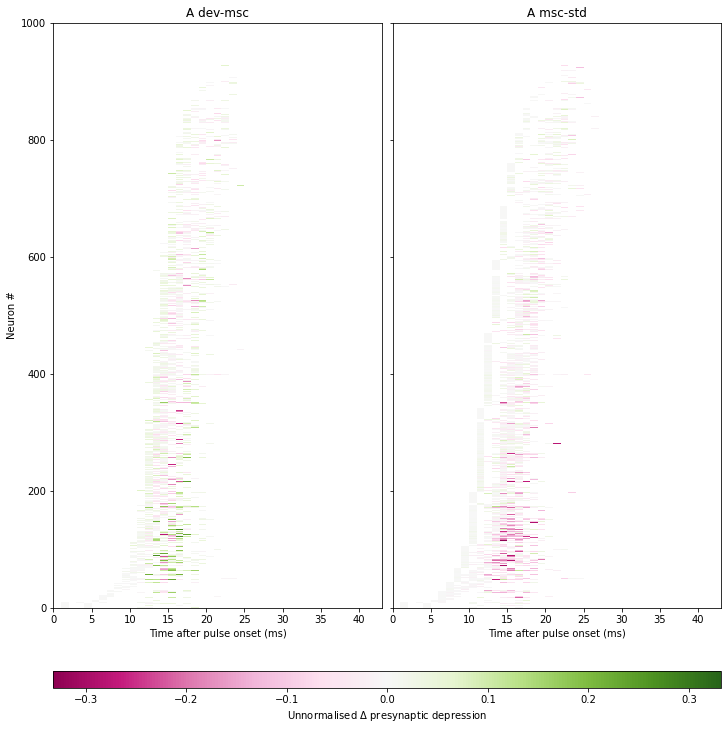

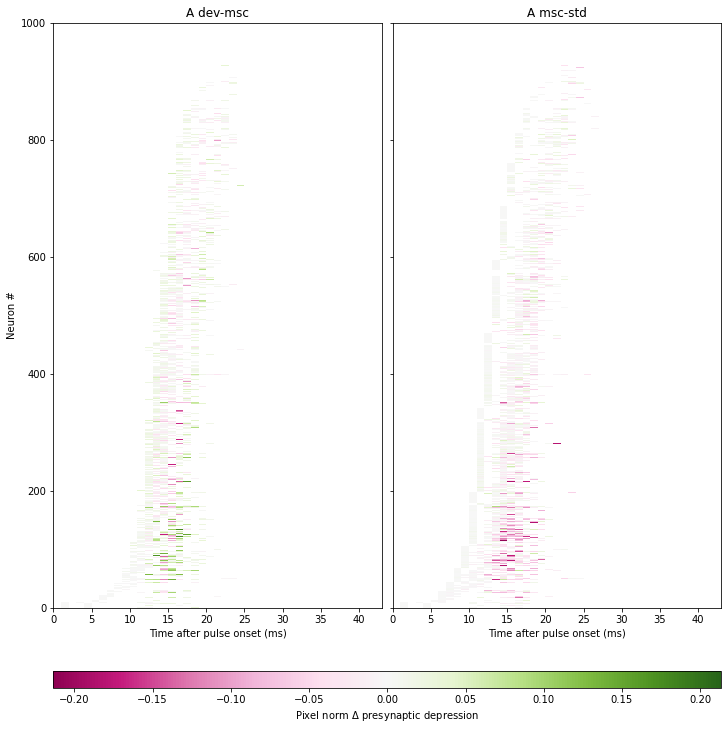

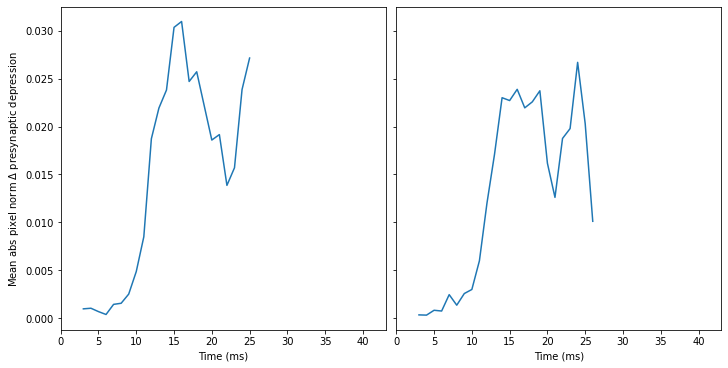

In [44]:
Wb = ~np.isnan(W)
def infusion(results, p, i, t):
    out = np.empty(len(i))
    for j, (post, tick) in enumerate(zip(i, t)):
        pre = np.flatnonzero(Wb[:, post])
        out[j] = results['xr'][pre, p, tick].mean()
    return out
plot_lots(infusion, 'presynaptic depression', plain, contrasts, width, height, ids=('A'))

## First 50 respondents

In [45]:
limit=50

WARNING    /tmp/ipykernel_1415059/2686837671.py:17: RuntimeWarning: invalid value encountered in true_divide
  hist_diff_pixelnorm = [(hists[c0] - hists[c1])/(hists[c0]+hists[c1]-2*hmin) for c0, c1 in contrasts]
 [py.warnings]
WARNING    /tmp/ipykernel_1415059/2686837671.py:43: RuntimeWarning: Mean of empty slice
  ax.plot(time(np.arange(tmax)), np.nanmean(np.abs(hist[selection, :tmax]), 0))
 [py.warnings]


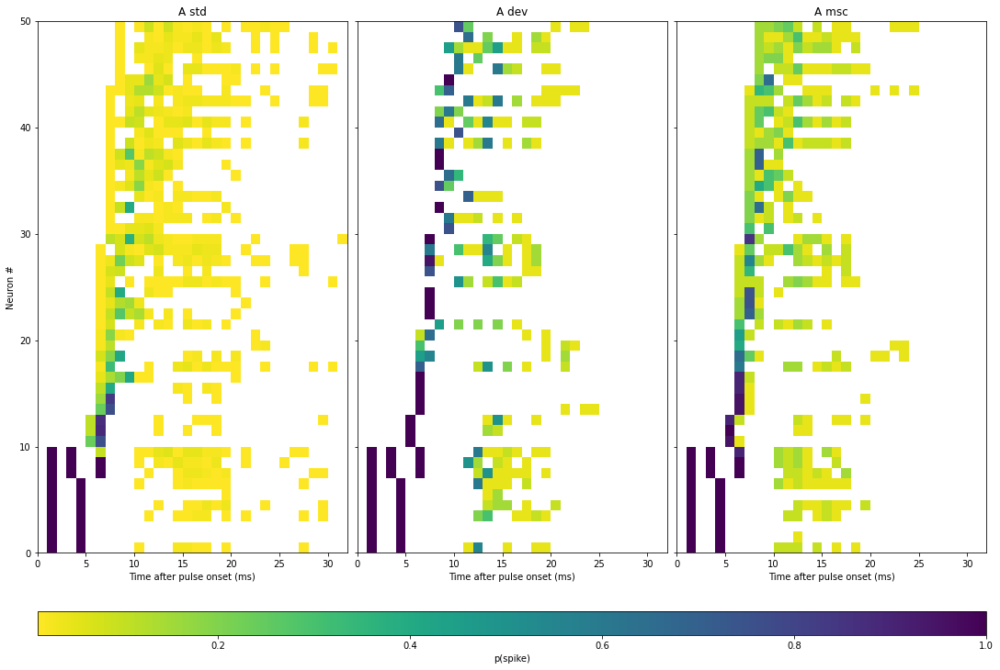

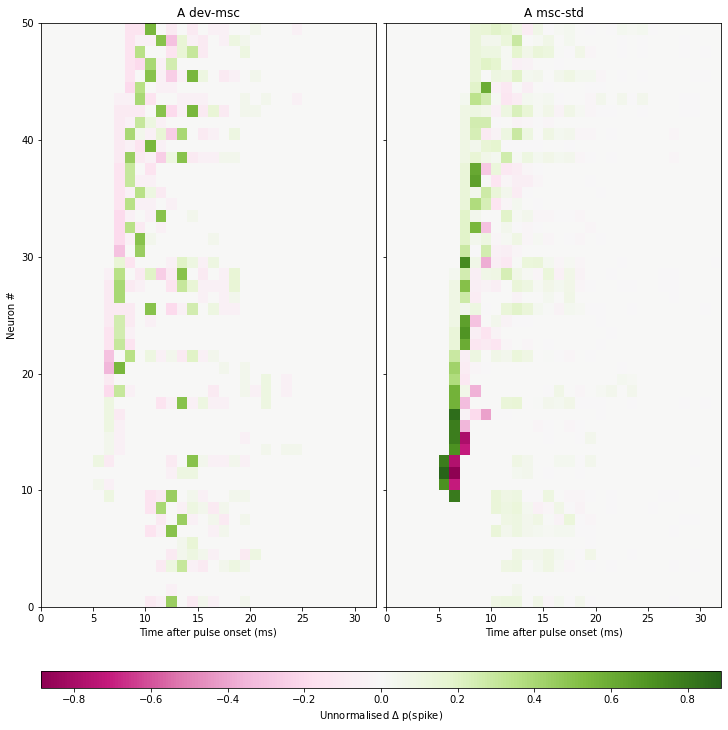

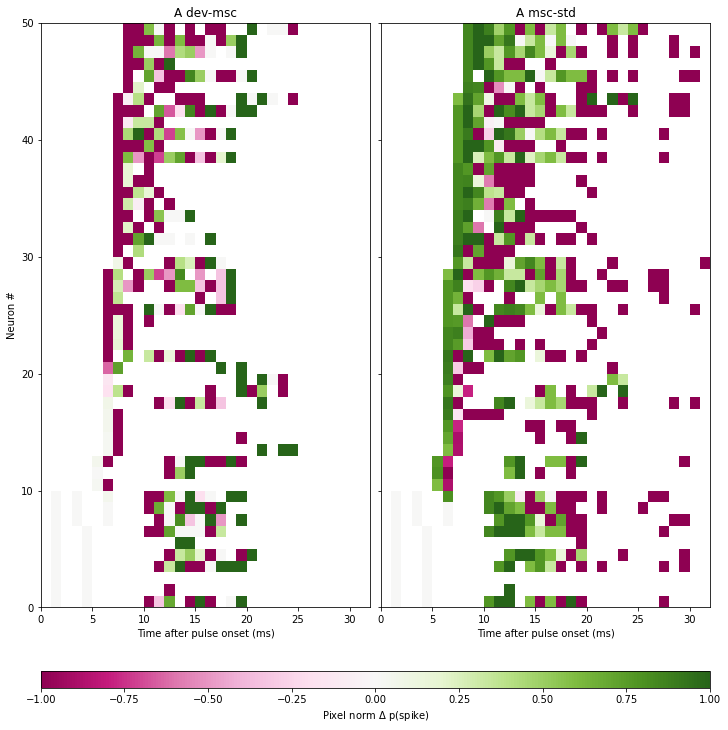

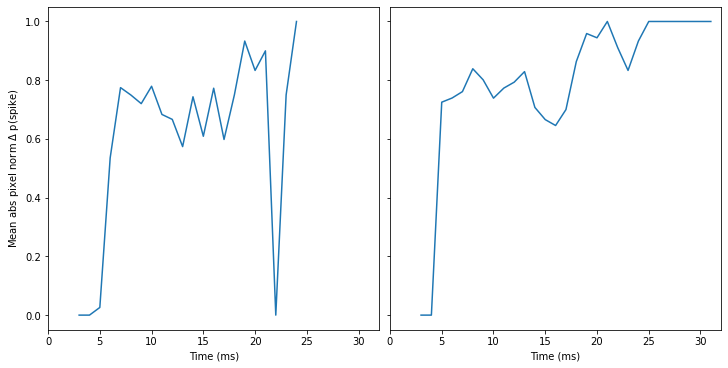

In [46]:
plot_lots(lambda r,i,p,t: 1, 'p(spike)', plain, contrasts, width, height, include_zeros=True, norm=False, ids=('A'), limit=limit)

WARNING    /tmp/ipykernel_1415059/2686837671.py:43: RuntimeWarning: Mean of empty slice
  ax.plot(time(np.arange(tmax)), np.nanmean(np.abs(hist[selection, :tmax]), 0))
 [py.warnings]


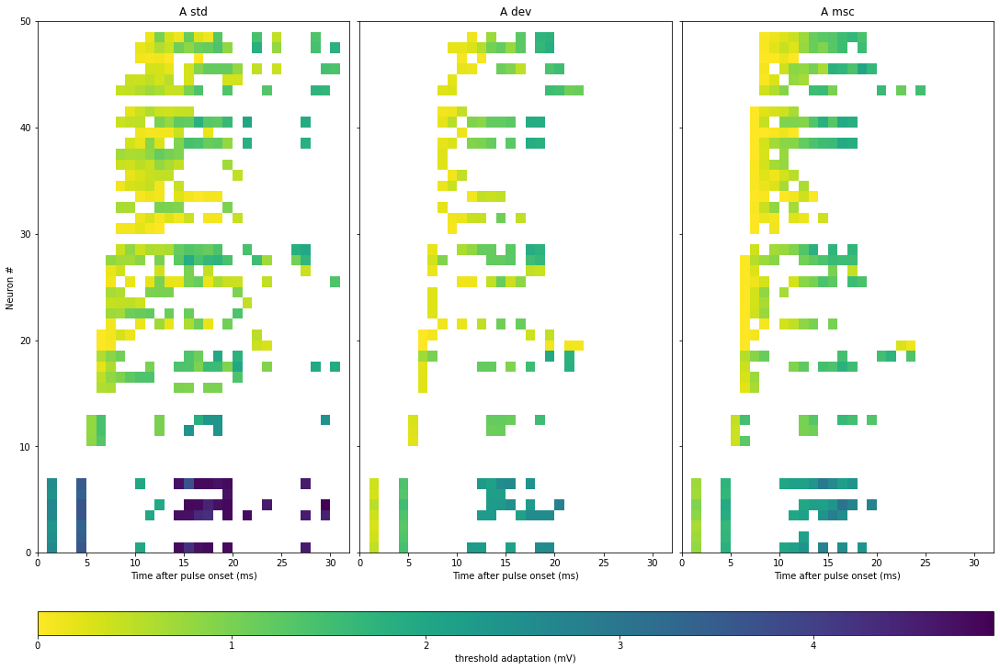

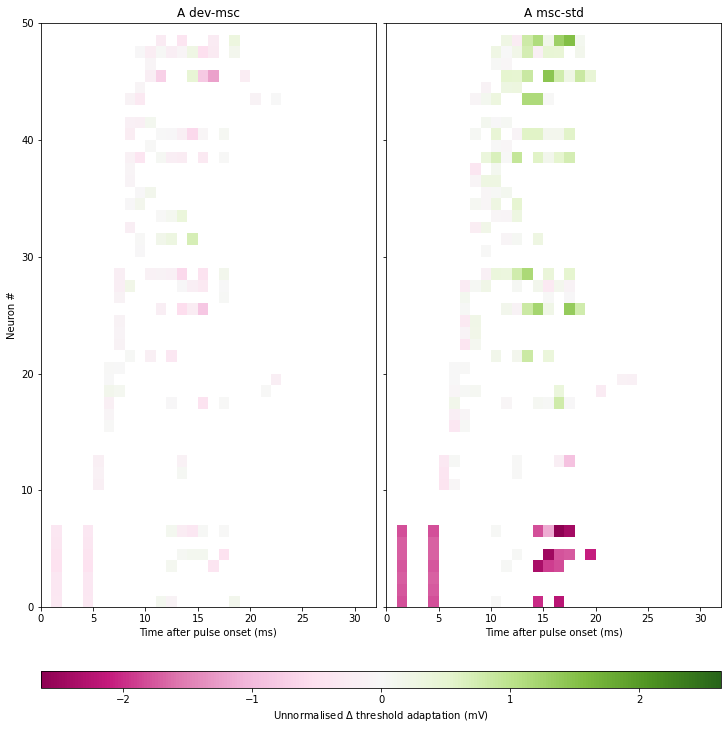

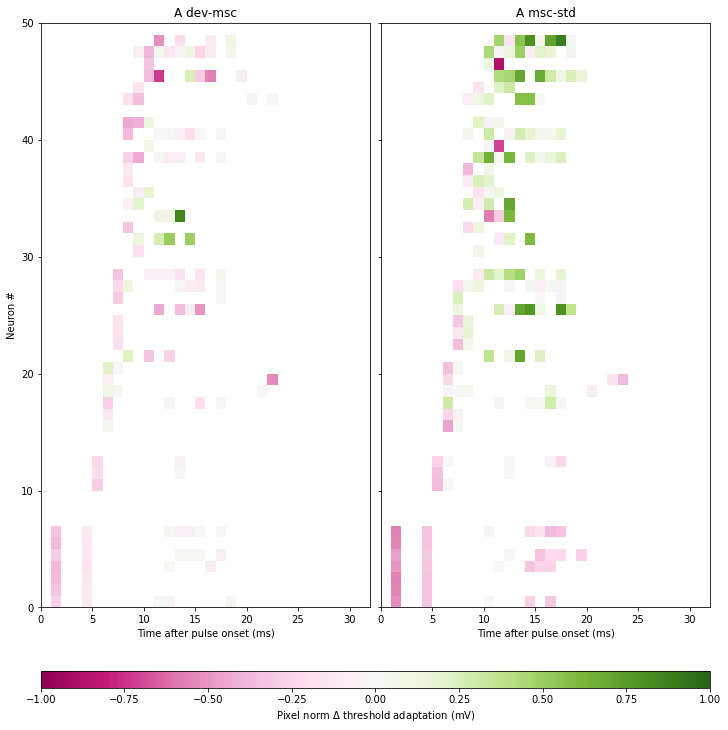

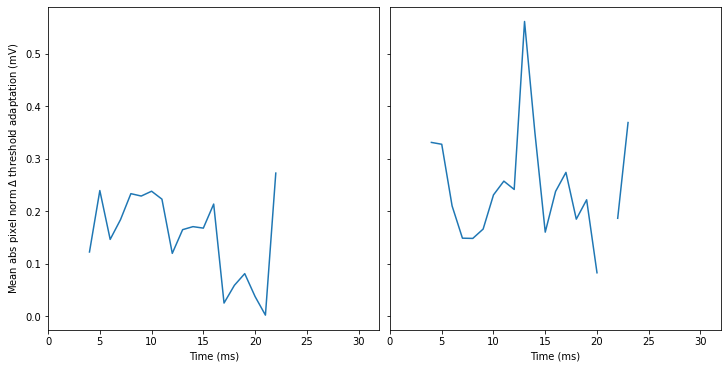

In [47]:
plot_lots(lambda r,p,i,t: r['th_adapt'][i,p,t]/mV, 'threshold adaptation (mV)', plain, contrasts, width, height, ids=('A'), limit=limit)

WARNING    /tmp/ipykernel_1415059/2686837671.py:43: RuntimeWarning: Mean of empty slice
  ax.plot(time(np.arange(tmax)), np.nanmean(np.abs(hist[selection, :tmax]), 0))
 [py.warnings]


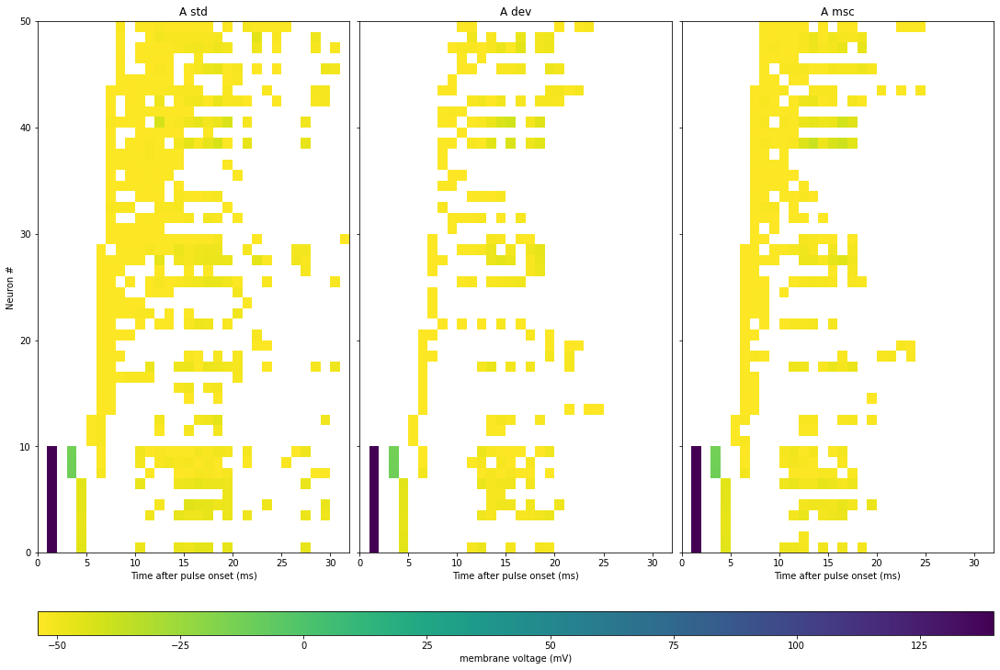

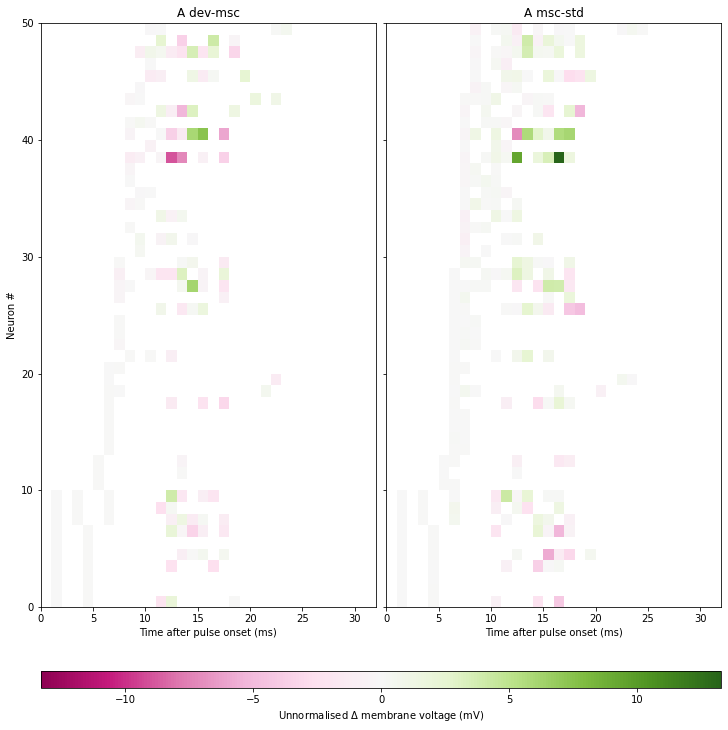

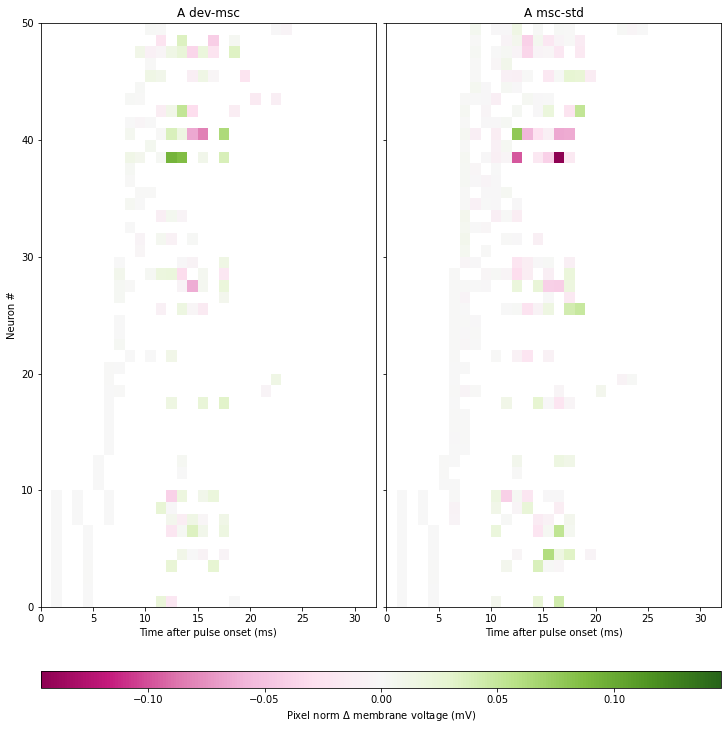

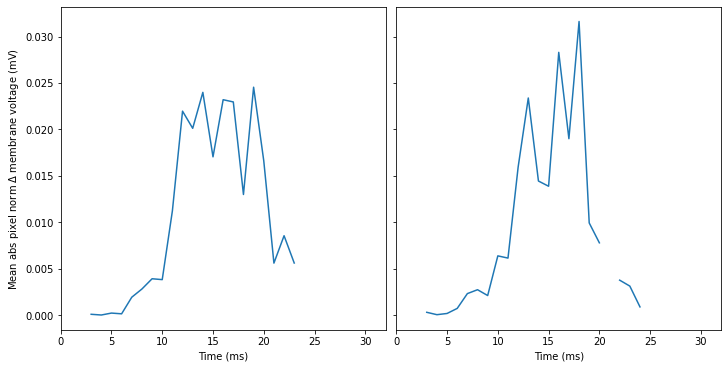

In [48]:
plot_lots(lambda r,p,i,t: r['v'][i,p,t]/mV, 'membrane voltage (mV)', plain, contrasts, width, height, ids=('A'), limit=limit)

WARNING    /tmp/ipykernel_1415059/2686837671.py:43: RuntimeWarning: Mean of empty slice
  ax.plot(time(np.arange(tmax)), np.nanmean(np.abs(hist[selection, :tmax]), 0))
 [py.warnings]


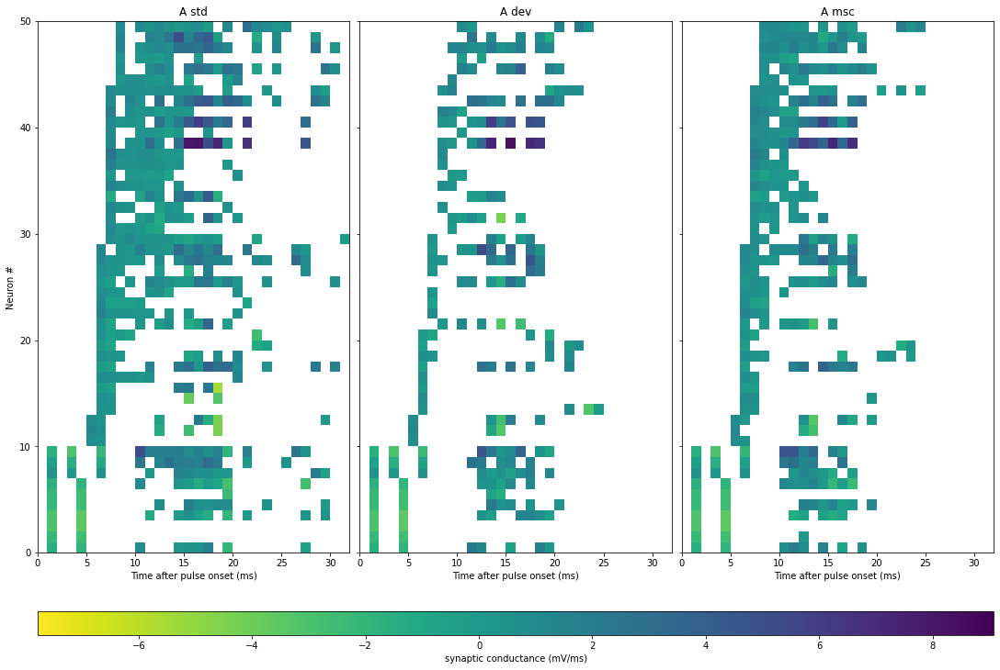

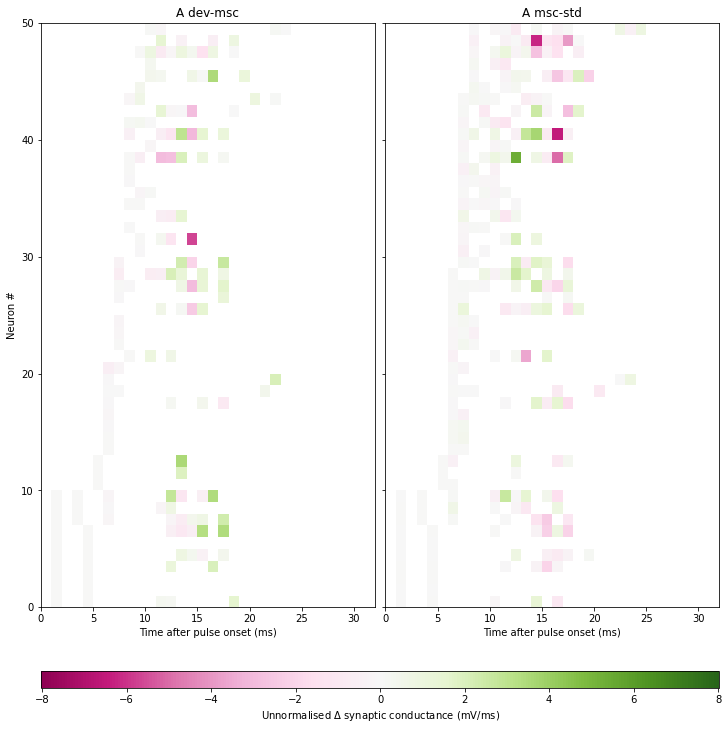

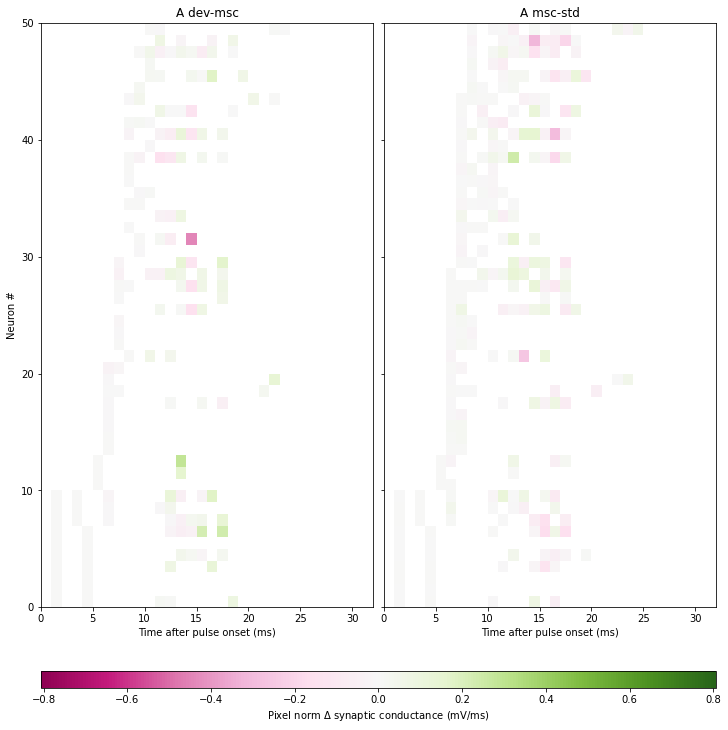

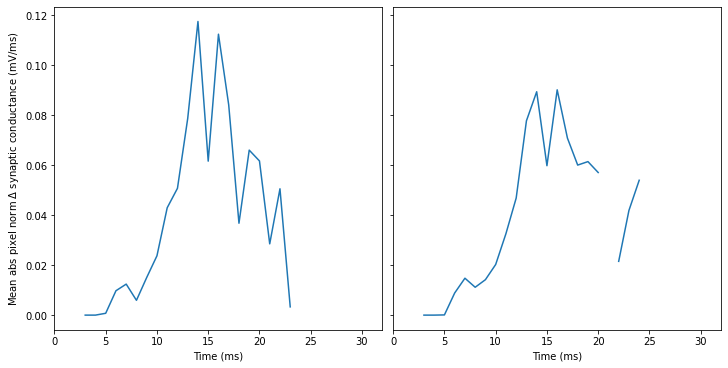

In [49]:
plot_lots(lambda r,p,i,t: r['g_exc_nox'][i,p,t] - r['g_inh'][i,p,t], 'synaptic conductance (mV/ms)', plain, contrasts, width, height, norm_to_min=True, ids=('A'), limit=limit)

WARNING    /tmp/ipykernel_1415059/2686837671.py:43: RuntimeWarning: Mean of empty slice
  ax.plot(time(np.arange(tmax)), np.nanmean(np.abs(hist[selection, :tmax]), 0))
 [py.warnings]


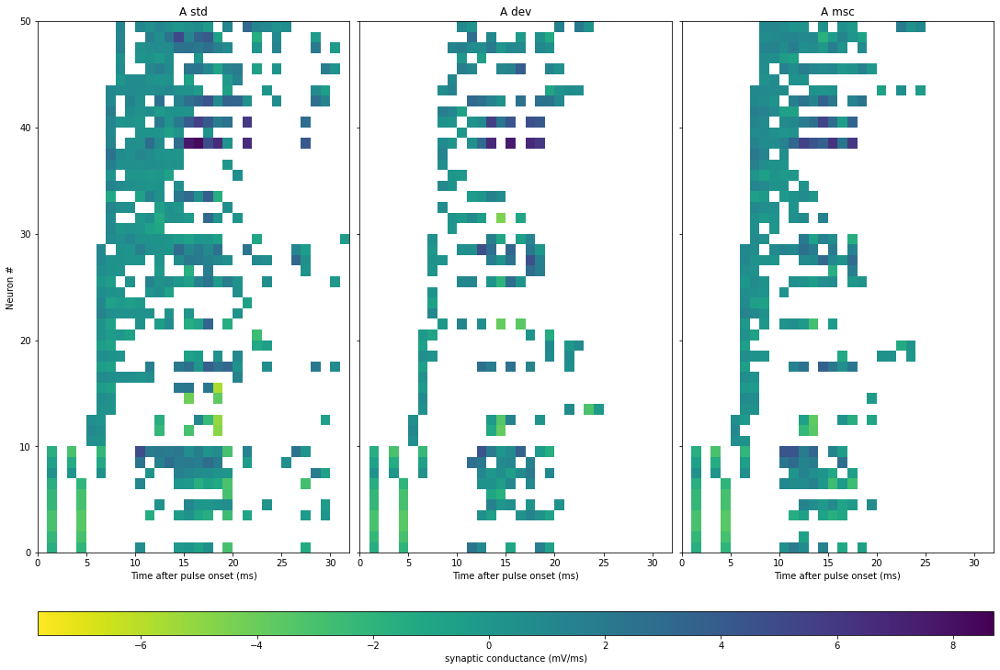

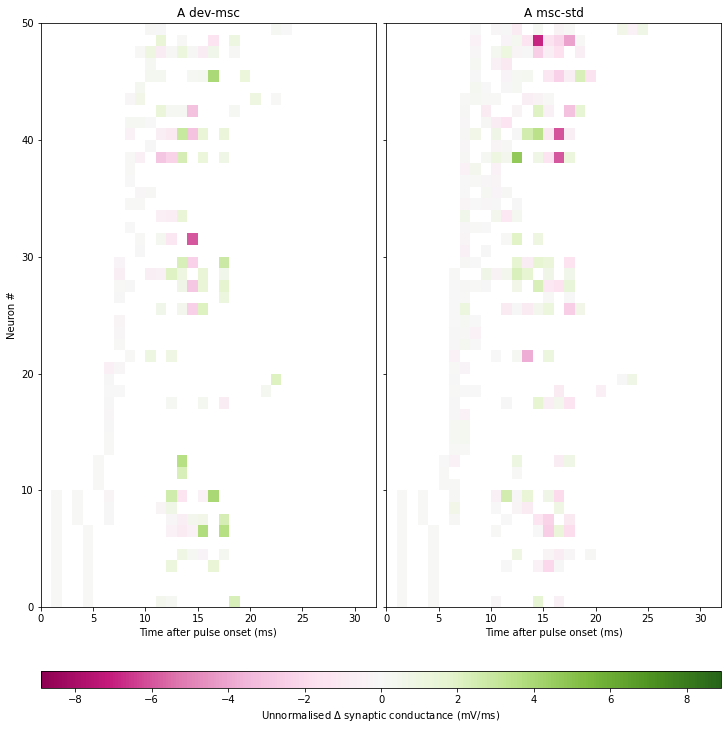

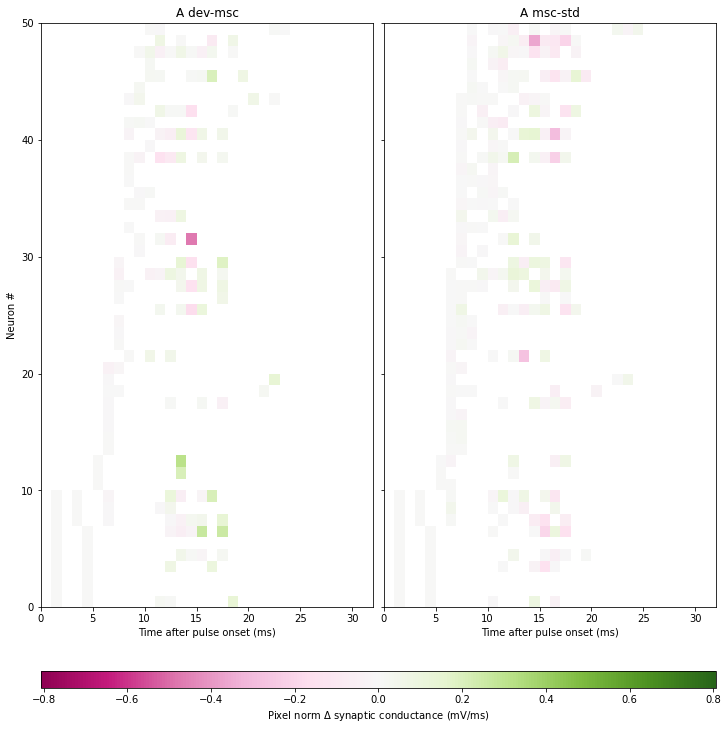

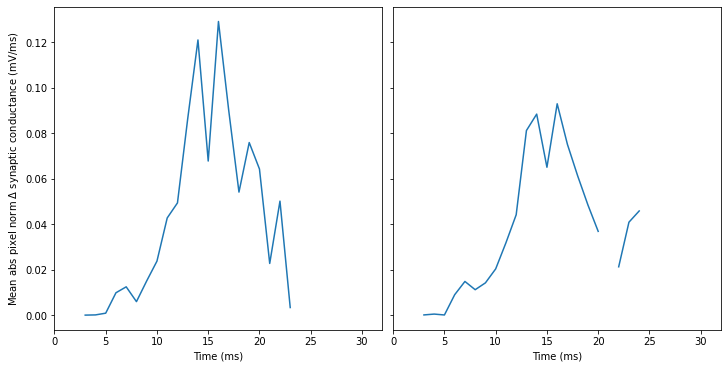

In [50]:
plot_lots(lambda r,p,i,t: r['g_exc'][i,p,t] - r['g_inh'][i,p,t], 'synaptic conductance (mV/ms)', plain, contrasts, width, height, norm_to_min=True, ids=('A'), limit=limit)

WARNING    /tmp/ipykernel_1415059/2686837671.py:43: RuntimeWarning: Mean of empty slice
  ax.plot(time(np.arange(tmax)), np.nanmean(np.abs(hist[selection, :tmax]), 0))
 [py.warnings]


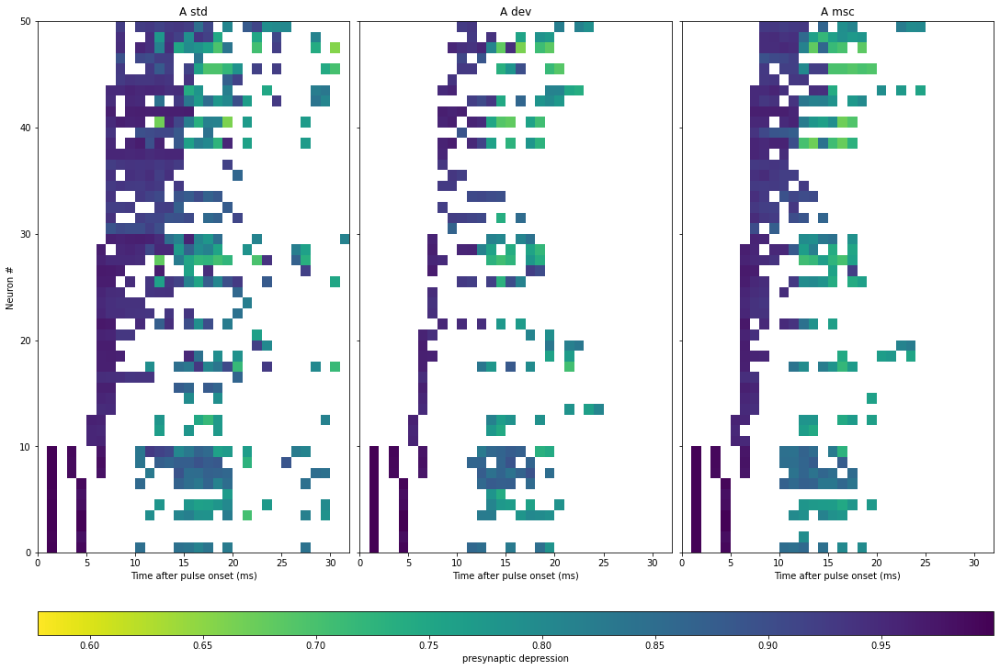

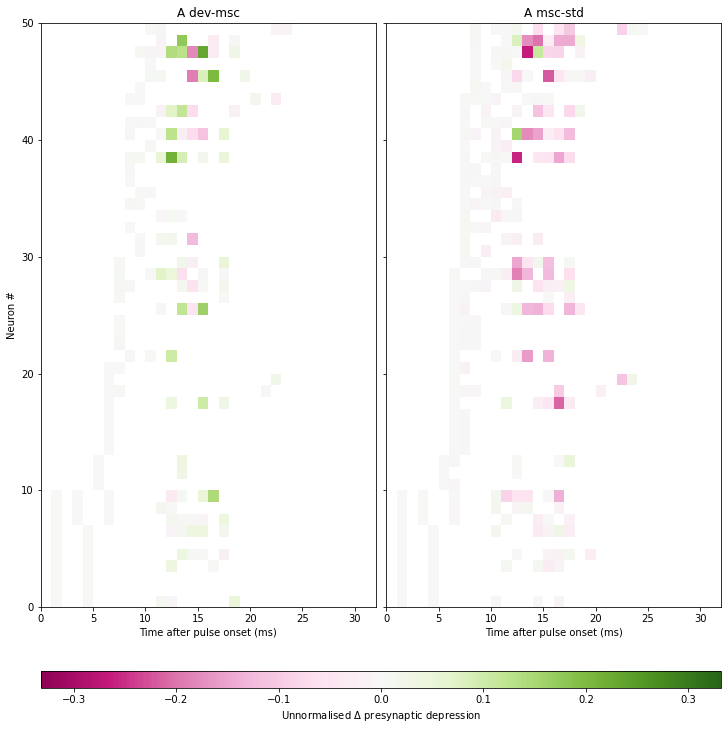

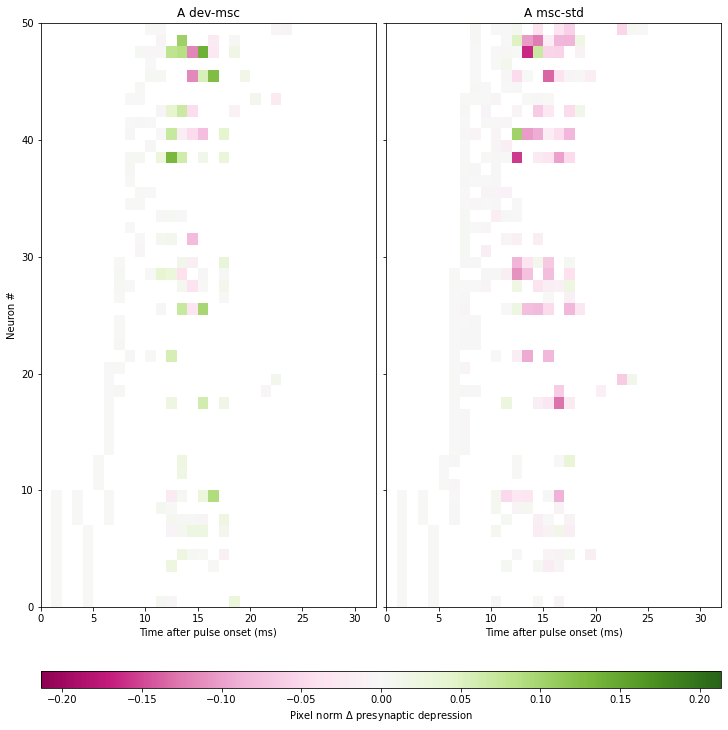

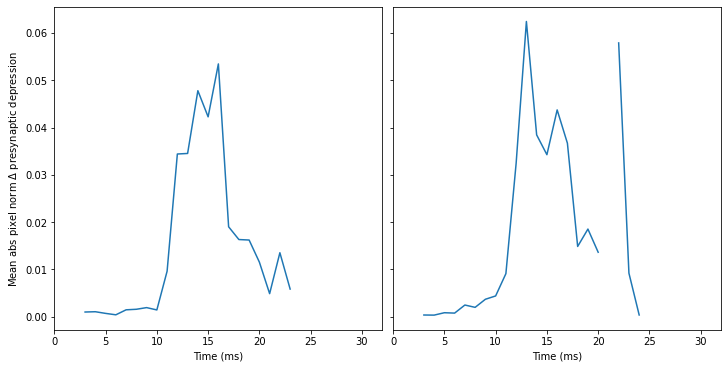

In [51]:
Wb = ~np.isnan(W)
def infusion(results, p, i, t):
    out = np.empty(len(i))
    for j, (post, tick) in enumerate(zip(i, t)):
        pre = np.flatnonzero(Wb[:, post])
        out[j] = results['xr'][pre, p, tick].mean()
    return out
plot_lots(infusion, 'presynaptic depression', plain, contrasts, width, height, ids=('A'), limit=limit)

# Activity, Depression and Adaptation indices
a.k.a.: Why did my neuron NOT fire?

In [52]:
def get_depression_index(params, results):
    mask = results['u'] > params['v_threshold']
    adaptation = results['th_adapt']
    depression = results['u'] - results['v']
    index = np.full(mask.shape, np.nan)
    np.divide(depression, adaptation + depression, out=index, where=mask)
    return mask, index

In [53]:
indices = {key: get_depression_index(params, all_results['A'][key]) for key in plain}
activity = {k: v[0] for k, v in indices.items()}
depression = {k: v[1] for k, v in indices.items()}
selection, tmax = get_onset_ordering(all_results['A'])
selection_exc, tmax = get_onset_ordering(all_results['A'], filter=np.arange(params['N_exc']))
x = time(np.arange(tmax))
cols = {'std': 'k', 'dev': 'r', 'msc': 'b'}

plain = ('std', 'dev', 'msc')
contrasts = (('dev','msc'), ('msc','std'), ('dev','std'))
width, height = 5, 10

WARNING    /tmp/ipykernel_1415059/3985507350.py:6: RuntimeWarning: invalid value encountered in true_divide
  np.divide(depression, adaptation + depression, out=index, where=mask)
 [py.warnings]


WARNING    /tmp/ipykernel_1415059/1534393929.py:24: RuntimeWarning: Mean of empty slice
  data_[i-1] = {key: np.nanmean(data, axis=1) for key, data in data_[i-1].items()}
 [py.warnings]
WARNING    /tmp/ipykernel_1415059/1911424626.py:18: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(1, len(histograms), figsize=figsize, sharex=True, sharey=True, constrained_layout=True, squeeze=False)
 [py.warnings]
WARNING    /tmp/ipykernel_1415059/1534393929.py:55: RuntimeWarning: Mean of empty slice
  m0, m1 = [np.nanmean(hists[c][sel, :tmax], 0) for c in (c0, c1)]
 [py.warnings]
WARNING    /tmp/ipykernel_1415059/1534393929.py:68: RuntimeWarning: Mean of empty slice
  m0, m1 = [np.nanmean(hists[c][sel, :tmax], 1) for c in (c0, c1)]
 [py.warnings]


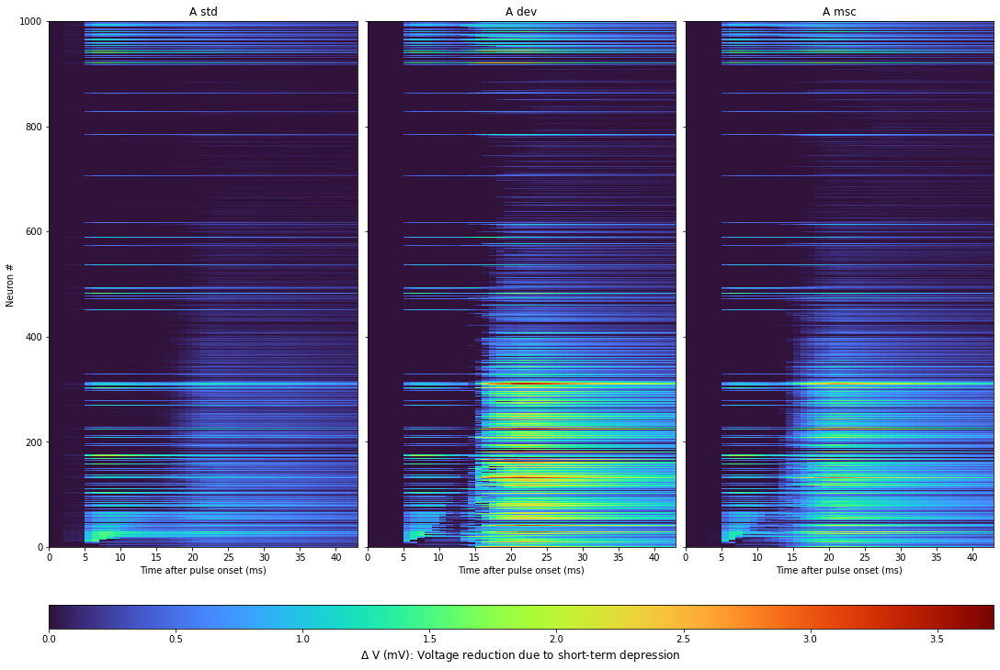

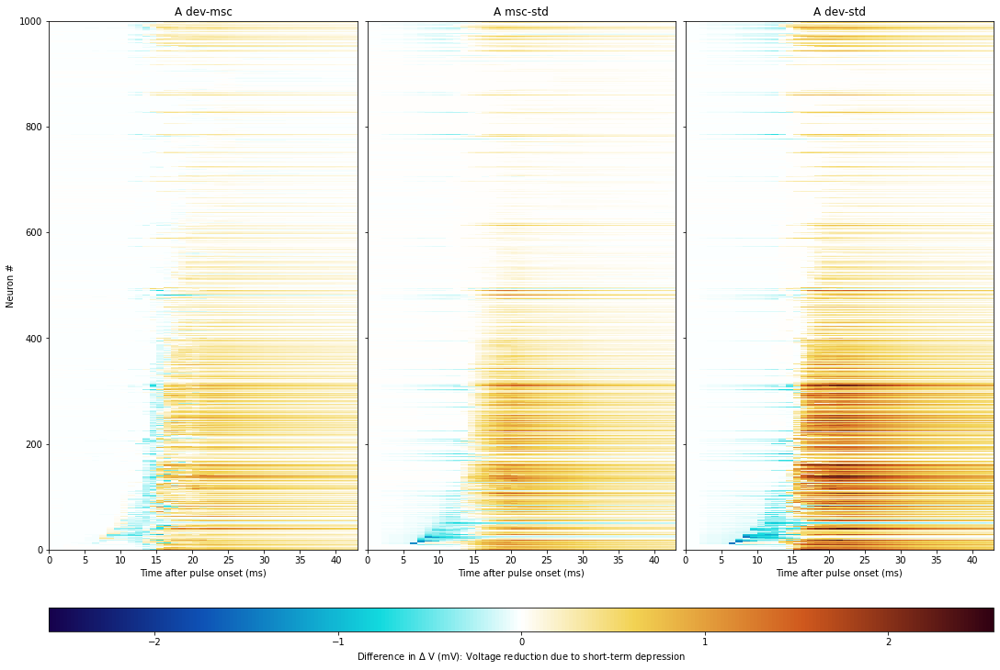

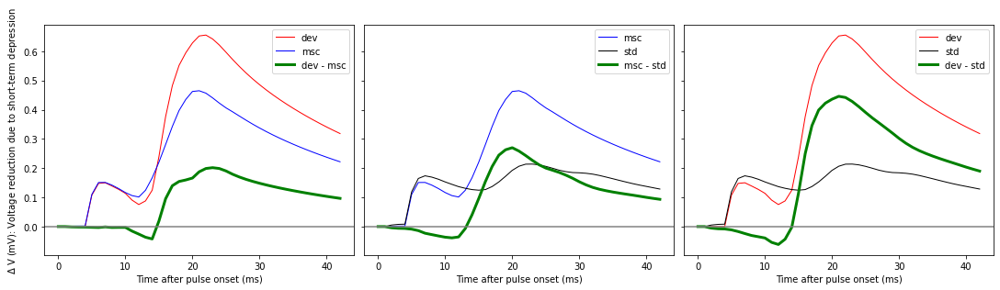

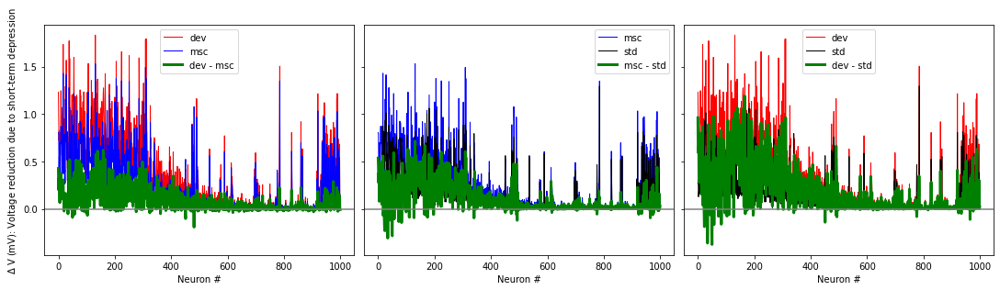

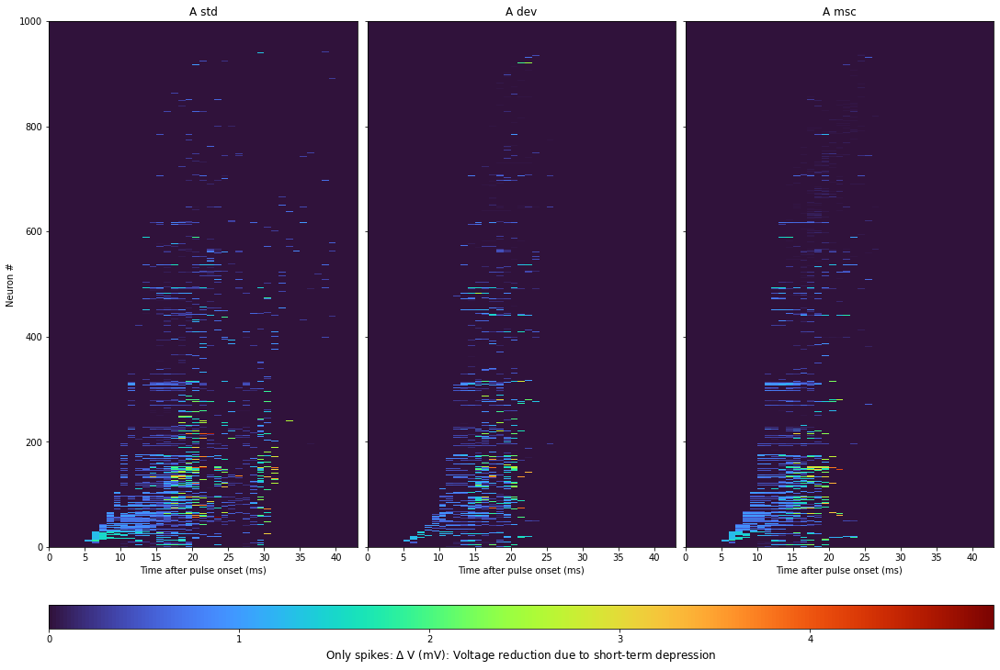

...

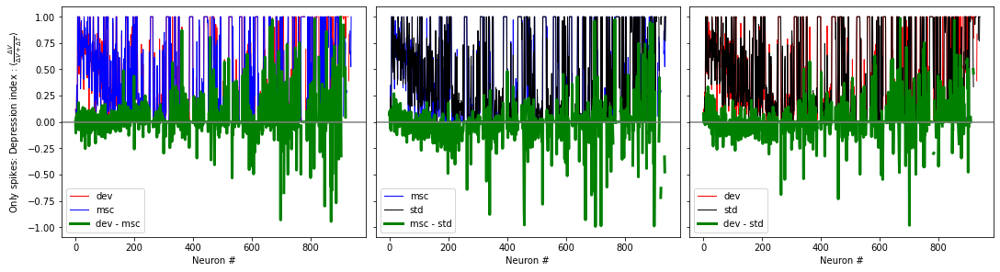

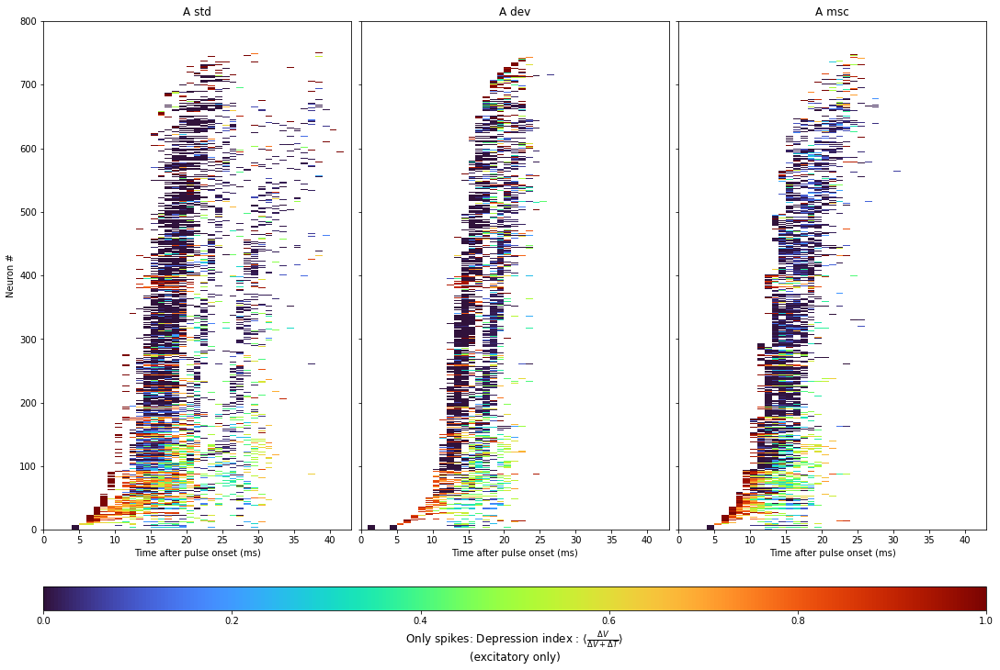

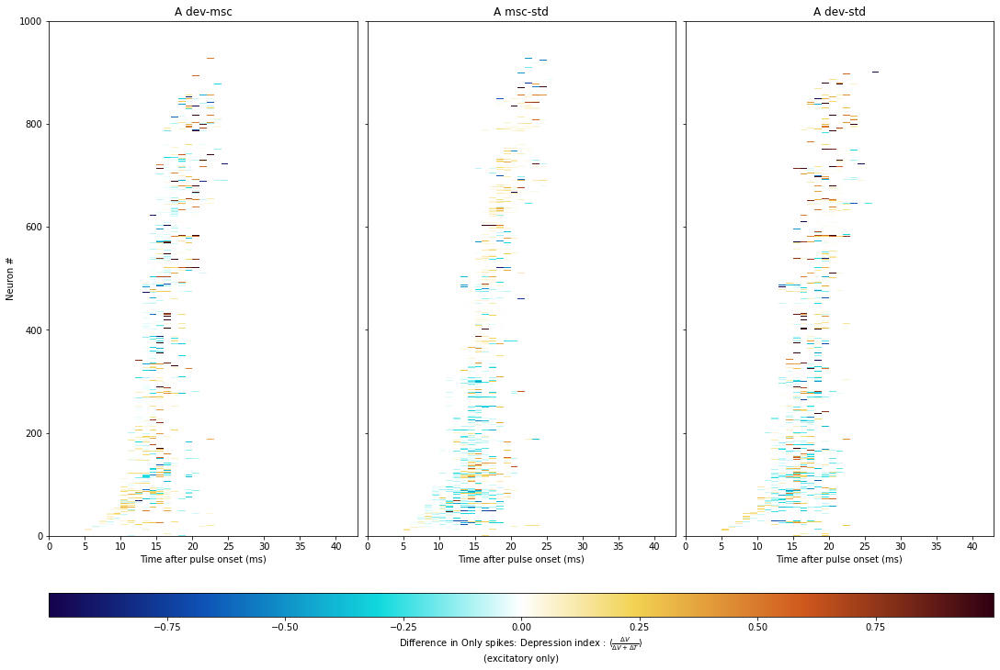

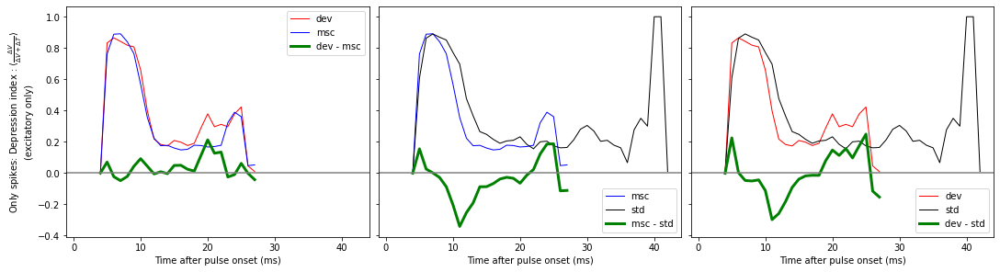

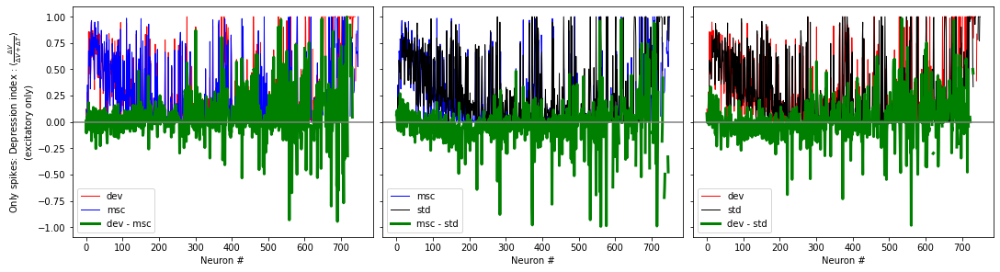

In [54]:
infusion = lambda r, p, i, t, val: val[i, p, t]

data_ = [
    {key: (all_results['A'][key]['u'] - all_results['A'][key]['v'])/mV for key in plain},
    0,
    {key: all_results['A'][key]['th_adapt']/mV for key in plain},
    0,
    {key: all_results['A'][key]['spike_hist'] for key in plain},
    {key: val.mean(1) for key, val in activity.items()},
    depression,
    np.nan
]
labels_ = [
    '$\\Delta$ V (mV): Voltage reduction due to short-term depression',
    '$\\Delta$ T (mV): Threshold increase due to threshold adaptation',
    'p(spike)',
    'Activity index : $\\langle  V_m + \\Delta V > v_{th}  \\rangle$',
    'Depression index : $\\langle \\frac{\\Delta V}{\\Delta V + \\Delta T} \\rangle$'
]
exclude_inh_ = [False, True, False, False, True]
for i, d in enumerate(data_):
    if type(d) != dict:
        data_[i] = {key: readout.get_infused_histogram(params, all_results['A'][key], infusion, norm=True, default=d, val=val) for key, val in data_[i-1].items()}
        data_[i-1] = {key: np.nanmean(data, axis=1) for key, data in data_[i-1].items()}
        labels_.insert(i, f'Only spikes: {labels_[i-1]}')
        exclude_inh_.insert(i, exclude_inh_[i-1])


for hists, label, exclude_inh in zip(data_, labels_, exclude_inh_):
    if exclude_inh:
        filters = [None, np.arange(params['N_exc'])]
        filter_labels = ['', '\n(excitatory only)']
        selections = [selection, selection_exc]
    else:
        filters, filter_labels, selections = [None], [''], [selection]
    
    for filter, filter_label, sel in zip(filters, filter_labels, selections):
        # Single condition
        fig, axs, cb = plot_pulse_hist(all_results['A'], list(hists.values()), figsize=(width*len(hists), height), symmetric=False, cmap='turbo', filter=filter)
        cb.set_label(f'{label} {filter_label}', fontsize=12)
        for ax, key in zip(axs, hists.keys()):
            ax.set_title(f'A {key}')

        # Direct contrast
        fig, axs, cb = plot_pulse_hist(all_results['A'], [hists[c0] - hists[c1] for c0, c1 in contrasts],
                                       figsize=(width*len(contrasts), height), symmetric=True, cmap=ccc_divergent)
        cb.set_label(f'Difference in {label} {filter_label}')
        for ax, (c0, c1) in zip(axs, contrasts):
            ax.set_title(f'A {c0}-{c1}')

        # Mean contrast over time
        fig, axs = plt.subplots(ncols=len(contrasts), figsize=(width*len(contrasts), 4), sharex=True, sharey=True, squeeze=False, constrained_layout=True)
        axs = axs[0]
        for ax, (c0, c1) in zip(axs, contrasts):
            m0, m1 = [np.nanmean(hists[c][sel, :tmax], 0) for c in (c0, c1)]
            ax.plot(x, m0, c=cols[c0], label=c0, lw=1)
            ax.plot(x, m1, c=cols[c1], label=c1, lw=1)
            ax.plot(x, m0-m1, c='g', label=f'{c0} - {c1}', lw=3)
            ax.legend()
            ax.set_xlabel('Time after pulse onset (ms)')
            ax.axhline(0, color='grey')
        axs[0].set_ylabel(f'{label} {filter_label}')

        # Mean contrast across neurons
        fig, axs = plt.subplots(ncols=len(contrasts), figsize=(width*len(contrasts), 4), sharex=True, sharey=True, squeeze=False, constrained_layout=True)
        axs = axs[0]
        for ax, (c0, c1) in zip(axs, contrasts):
            m0, m1 = [np.nanmean(hists[c][sel, :tmax], 1) for c in (c0, c1)]
            ax.plot(np.arange(len(sel)), m0, c=cols[c0], label=c0, lw=1)
            ax.plot(np.arange(len(sel)), m1, c=cols[c1], label=c1, lw=1)
            ax.plot(np.arange(len(sel)), m0-m1, c='g', label=f'{c0} - {c1}', lw=3)
            ax.legend()
            ax.set_xlabel('Neuron #')
            ax.axhline(0, color='grey')
        axs[0].set_ylabel(f'{label} {filter_label}')

## All in the voltage space

In [55]:
selection, tmax = get_onset_ordering(all_results['A'])
x = time(np.arange(tmax))
cols = {'std': 'k', 'dev': 'r', 'msc': 'b'}

plain = ('std', 'dev', 'msc')
contrasts = (('dev','msc'), ('msc','std'), ('dev','std'))
width, height = 5, 10

In [56]:
def get_voltages(params, results):
    depression = results['u'] - results['v']
    threshold = results['th_adapt']
    activity = results['u'] - params['v_threshold']
    activity[activity >= threshold+depression] = np.nan*volt
    # activity = np.minimum(results['u'] - params['v_threshold'], threshold+depression) # Clip overshoot to actual threshold
    return activity/mV, depression/mV, threshold/mV

In [57]:
measures = ('Activity', 'Depression', 'Threshold')
voltages = {k: {} for k in measures}
activity_mask = 0
max_activity = -100
for key in plain:
    a, d, th = get_voltages(params, all_results['A'][key])
    voltages['Activity'][key], voltages['Depression'][key], voltages['Threshold'][key] = a, d, th
    activity_mask += np.nansum(a >= 0, axis=1) + np.isnan(a).sum(1)
    max_activity = max(np.max(d + th), max_activity)
inactive_nan = np.full(activity_mask.shape, np.nan)
inactive_nan[activity_mask > 0] = 1
for a in voltages['Activity'].values():
    a[np.isnan(a)] = max_activity

voltage_contrasts = {vkey: {(c0, c1): vval[c0].mean(1) - vval[c1].mean(1) for c0, c1 in contrasts} for vkey, vval in voltages.items()}
voltage_norm = {}
for c in contrasts:
    vnorm = sum([np.abs(cval[c]) for cval in voltage_contrasts.values()])
    vnorm[vnorm < 1e-2] = np.nan  # Ignore sub-microvolt differences (total across all measures)
    voltage_norm[c] = vnorm
voltage_norm_contrasts = {vkey: {c: vcontrast[c] / voltage_norm[c] for c in contrasts} for vkey, vcontrast in voltage_contrasts.items()}

WARNING    /tmp/ipykernel_1415059/2440053234.py:48: RuntimeWarning: Mean of empty slice
  ax.plot(x, np.nanmean(positive, 0), color=ccc_divergent(.75), label=f'{c[0]} > {c[1]}')
 [py.warnings]
WARNING    /tmp/ipykernel_1415059/2440053234.py:49: RuntimeWarning: Mean of empty slice
  ax.plot(x, -np.nanmean(negative, 0), color=ccc_divergent(.25), label=f'{c[0]} < {c[1]}')
 [py.warnings]
WARNING    /tmp/ipykernel_1415059/2440053234.py:61: RuntimeWarning: Mean of empty slice
  ax.plot(x, np.nanmean(np.abs(contrast), 0), label=measure)
 [py.warnings]
WARNING    /tmp/ipykernel_1415059/2440053234.py:83: RuntimeWarning: Mean of empty slice
  'as plotted': np.nanmean(np.nanmean(np.abs(contrast),0)),
 [py.warnings]
WARNING    /tmp/ipykernel_1415059/2440053234.py:48: RuntimeWarning: Mean of empty slice
  ax.plot(x, np.nanmean(positive, 0), color=ccc_divergent(.75), label=f'{c[0]} > {c[1]}')
 [py.warnings]
WARNING    /tmp/ipykernel_1415059/2440053234.py:49: RuntimeWarning: Mean of empty slice
  ax.

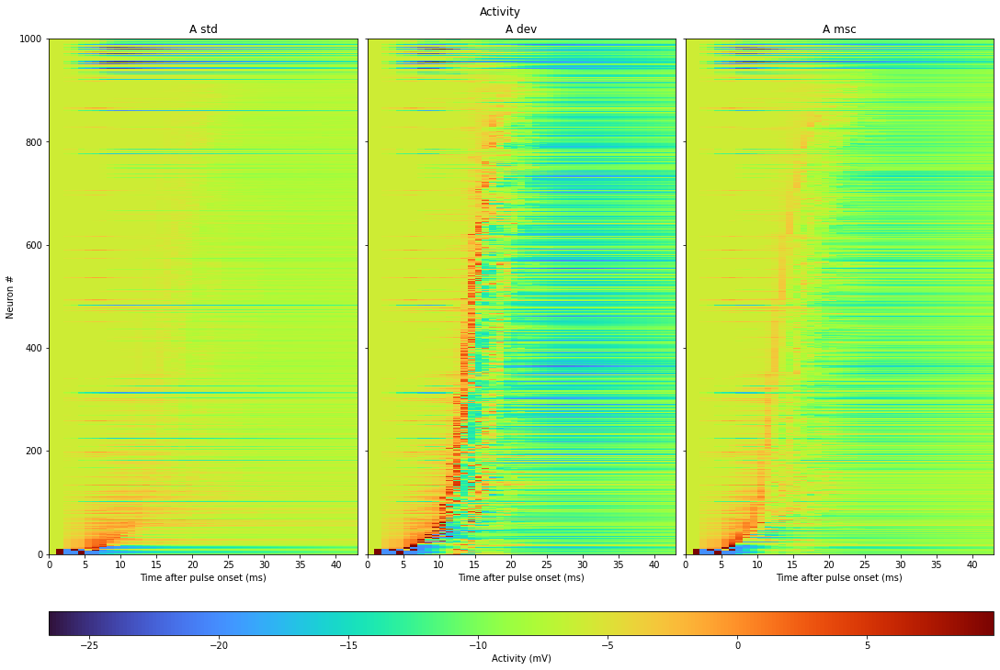

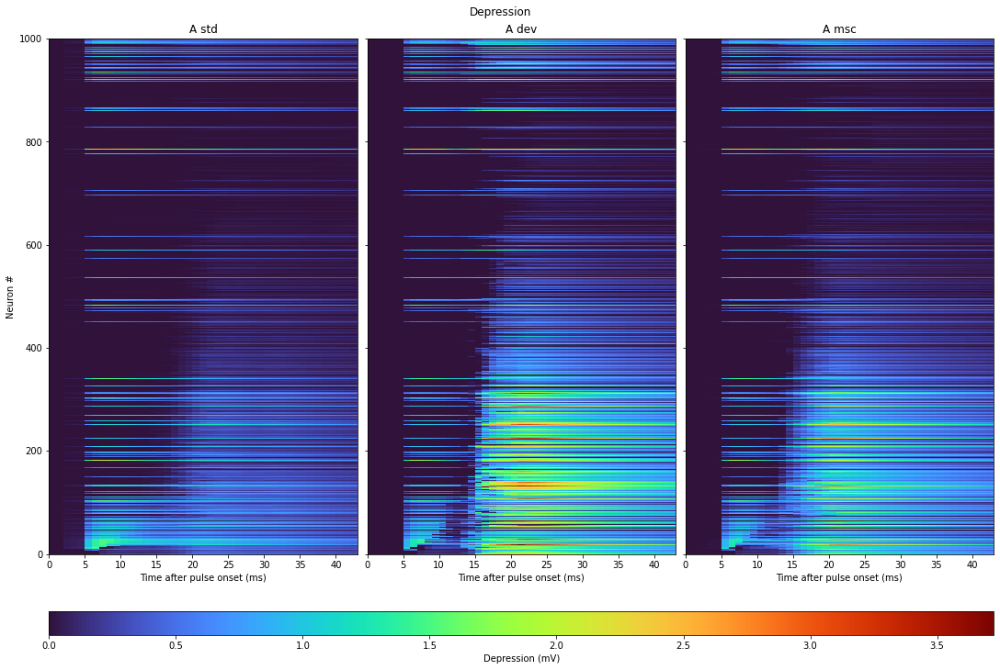

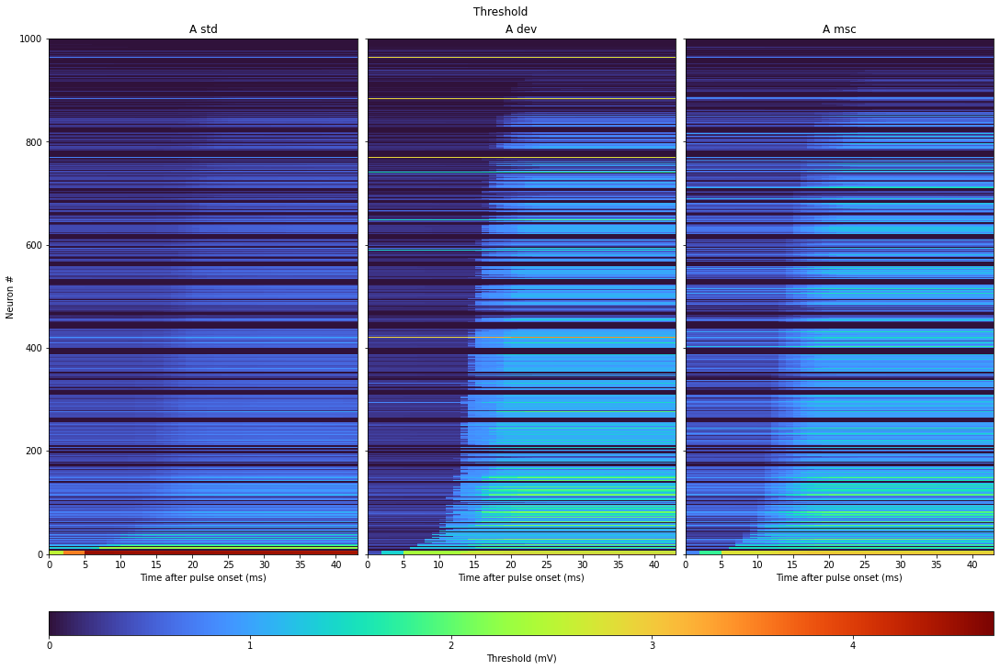

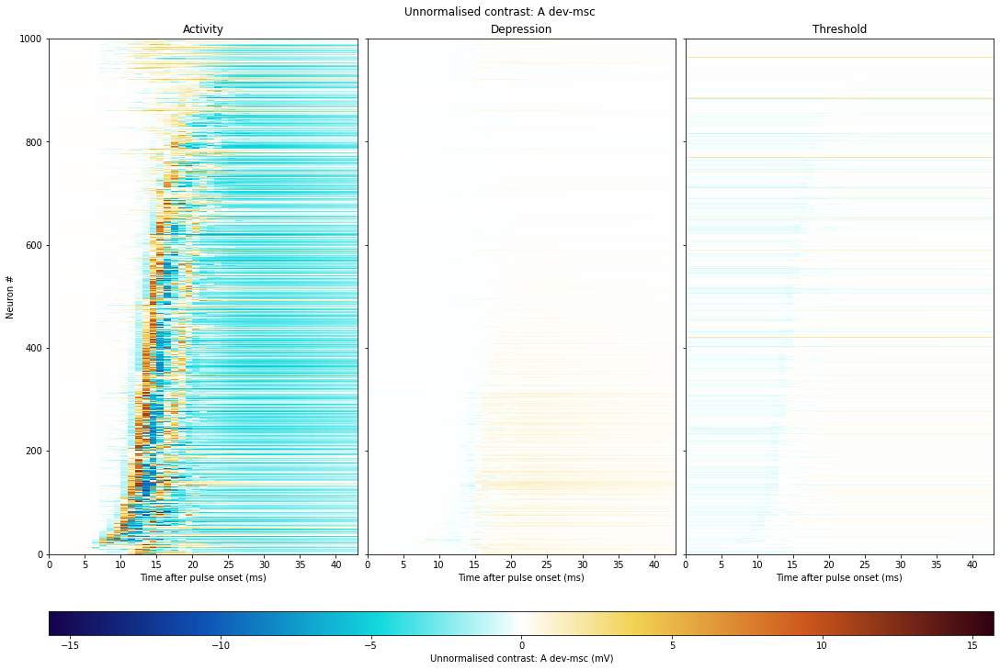

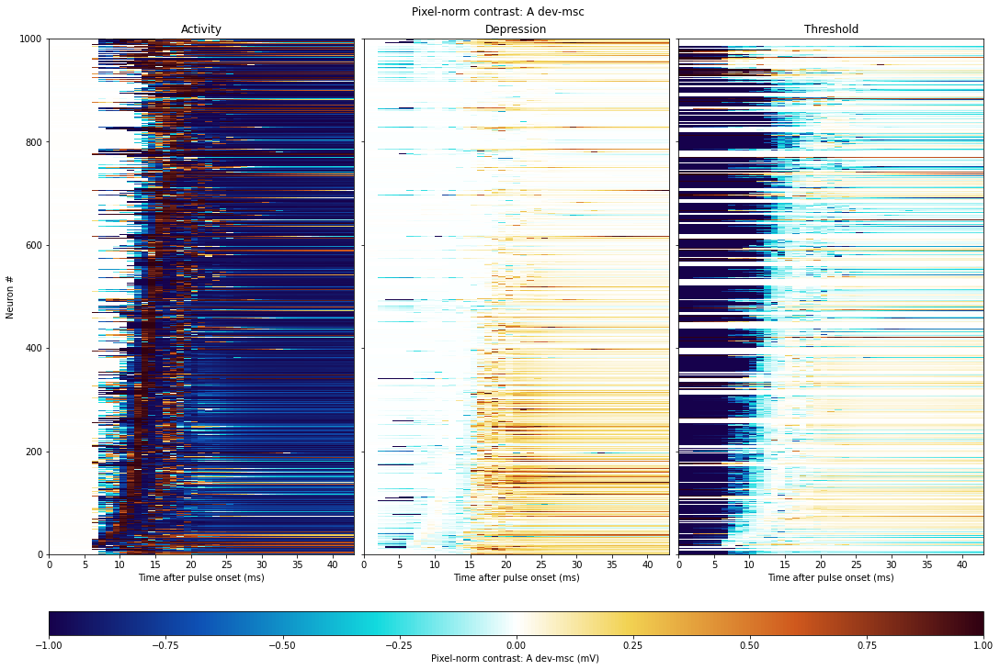

...

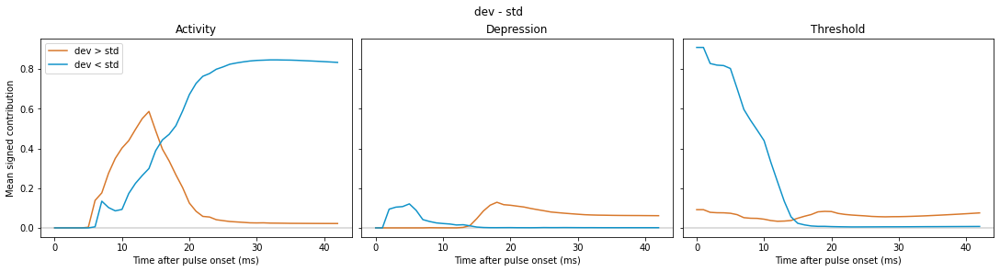

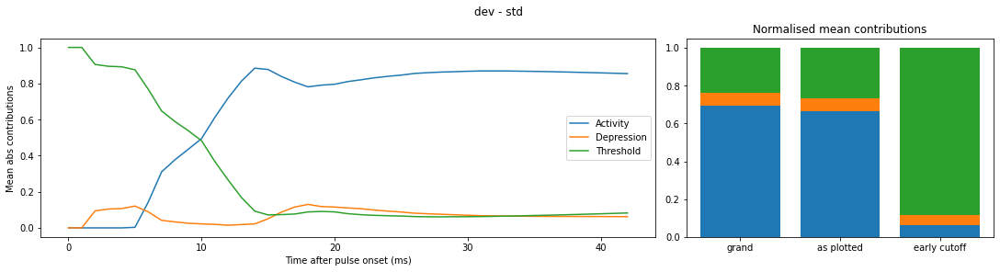

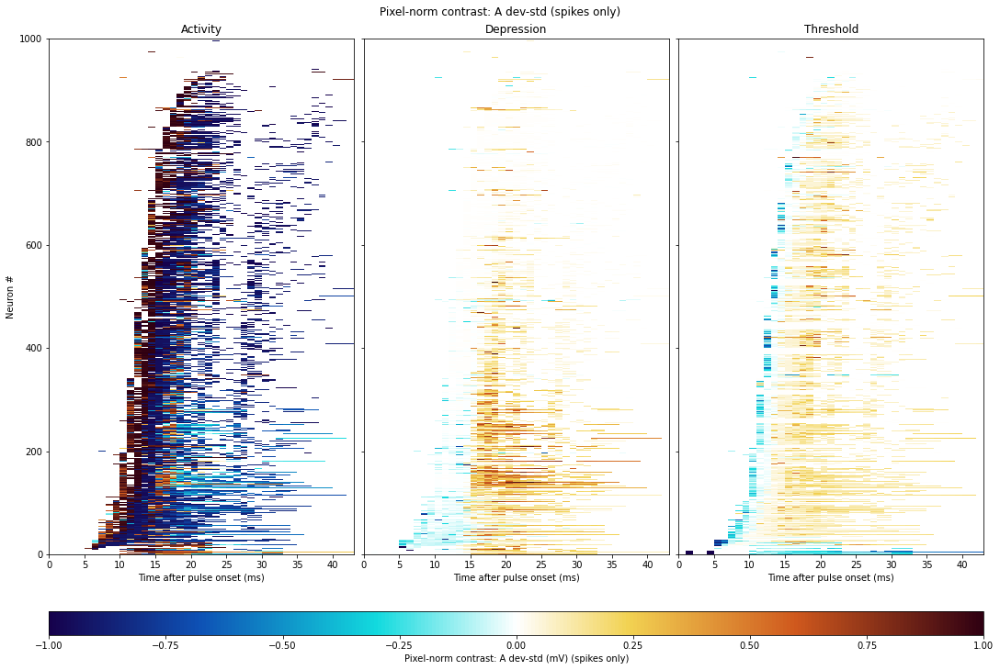

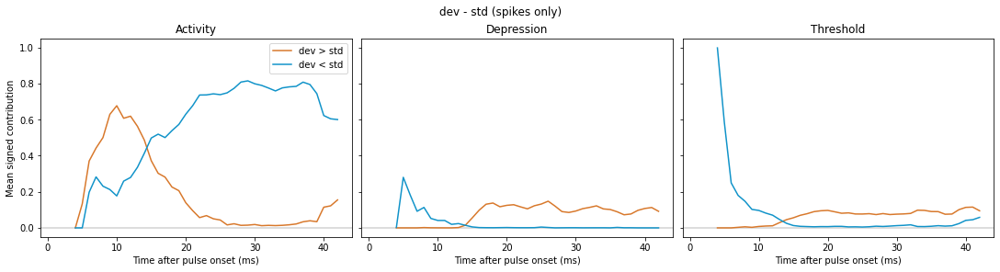

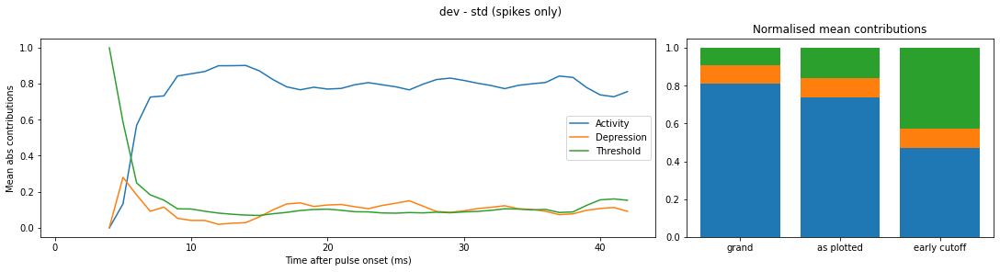

In [58]:
limit = 1000

# Raw values
for measure in measures:
    fig, axs, cb = plot_pulse_hist(
        all_results['A'], [vval.mean(1) for vval in voltages[measure].values()], figsize=(width*len(plain), height),
        symmetric=False, cmap='turbo', limit=limit, grid=limit<=200)
    cb.set_label(f'{measure} (mV)')
    fig.suptitle(measure)
    for ax, key in zip(axs, plain):
        ax.set_title(f'A {key}')

for c in contrasts:
    # Unnormalised contrast
    fig, axs, cb = plot_pulse_hist(
        all_results['A'], [cval[c] for cval in voltage_contrasts.values()], figsize=(width*len(measures), height),
        symmetric=True, cmap=ccc_divergent, limit=limit, grid=limit<=200)
    cb.set_label(f'Unnormalised contrast: A {c[0]}-{c[1]} (mV)')
    fig.suptitle(f'Unnormalised contrast: A {c[0]}-{c[1]}')
    for ax, measure in zip(axs, measures):
        ax.set_title(measure)
    
    # Norm contrast
    norm_contrast = {measure: ncval[c] for measure, ncval in voltage_norm_contrasts.items()}
    mask = (((voltages['Activity'][c[0]] >= 0).sum(1) + (voltages['Activity'][c[1]] >= 0).sum(1)) > 0).astype(float)
    mask[mask==0] = np.nan
    masked_norm_contrast = {measure: ncval[c] * mask for measure, ncval in voltage_norm_contrasts.items()}

    for masked, contrast_ in enumerate((norm_contrast, masked_norm_contrast)):
        spikesonly = '(spikes only)' if masked else ''
        fig, axs, cb = plot_pulse_hist(
            all_results['A'], list(contrast_.values()), figsize=(width*len(measures), height),
            symmetric=True, cmap=ccc_divergent, limit=limit, grid=limit<=200)
        cb.set_label(f'Pixel-norm contrast: A {c[0]}-{c[1]} (mV) {spikesonly}')
        fig.suptitle(f'Pixel-norm contrast: A {c[0]}-{c[1]} {spikesonly}')
        for ax, measure in zip(axs, measures):
            ax.set_title(measure)

        # Positive/negative over time
        fig, axs = plt.subplots(1, len(measures), figsize=(3*width, 4), constrained_layout=True, squeeze=False, sharex=True, sharey=True)
        axs = axs[0]
        for ax, (measure, contrast) in zip(axs, contrast_.items()):
            contrast = contrast[selection[:limit], :tmax]
            positive, negative = contrast.copy(), contrast.copy()
            positive[contrast <= 0] = 0
            negative[contrast >= 0] = 0
            ax.axhline(0, color='lightgrey')
            ax.plot(x, np.nanmean(positive, 0), color=ccc_divergent(.75), label=f'{c[0]} > {c[1]}')
            ax.plot(x, -np.nanmean(negative, 0), color=ccc_divergent(.25), label=f'{c[0]} < {c[1]}')
            ax.set_xlabel('Time after pulse onset (ms)')
            ax.set_title(measure)
        axs[0].set_ylabel('Mean signed contribution')
        axs[0].legend()
        fig.suptitle(f'{c[0]} - {c[1]} {spikesonly}')

        # Mean contrast over time
        fig, axs = plt.subplots(1, 2, figsize=(3*width, 4), constrained_layout=True, gridspec_kw={'width_ratios': [2, 1]})
        ax = axs[0]
        for measure, contrast in contrast_.items():
            contrast = contrast[selection[:limit], :tmax]
            ax.plot(x, np.nanmean(np.abs(contrast), 0), label=measure)
        ax.legend()
        ax.set_ylabel('Mean abs contributions')
        ax.set_xlabel('Time after pulse onset (ms)')
        fig.suptitle(f'{c[0]} - {c[1]} {spikesonly}')

        ax = axs[1]
        means = {}
        for measure, contrast in contrast_.items():
            contrast = contrast[selection[:limit], :tmax]

            # Find the first bin where activity > 75% (technically, the number of initial bins where the condition is unmet, incl NaN), per neuron:
            t_early_nrn = np.sum(np.cumsum(np.abs(contrast_['Activity'][selection[:limit], :tmax]) > .75, axis=1) == 0, axis=1)
            # Sum target contributions up to that bin:
            neuron_early_contrib = np.nancumsum(np.abs(contrast), 1)[np.arange(limit), t_early_nrn-1]
            # Remove faulty values (where bin 0 already has activity > 75%)
            neuron_early_contrib[t_early_nrn==0] = 0
            # Grand mean
            neuron_early_contrib = neuron_early_contrib.sum() / t_early_nrn.sum()

            means[measure] = {
                'grand': np.nanmean(np.abs(contrast)),
                'as plotted': np.nanmean(np.nanmean(np.abs(contrast),0)),
                'early cutoff': neuron_early_contrib
            }
        norm = {key: np.sum([mean[key] for mean in means.values()]) for key in means['Activity'].keys()}
        normed_means = {measure: [mean[key]/norm_ for key, norm_ in norm.items()] for measure, mean in means.items()}
        bottom = 0
        for i, measure in enumerate(means.keys()):
            ax.bar(norm.keys(), normed_means[measure], bottom=bottom)
            bottom += np.asarray(normed_means[measure])
        ax.set_title('Normalised mean contributions')